# Budowa modelu - część 3

Poprawki wprowadzone po uwzględnieniu uwag zespołu walidacji zostały dodane kolorem <font color="green">zielonym</font>.


## Plan projektu

1. Import potrzebnych pakietów i bibliotek
2. Wczytanie danych
3. Analiza działania różnych algorytmów klasteryzacji
    - 3.1. KMeans
    - 3.2. DBSCAN
    - 3.3. Klasteryzacja hierarchiczna:
        - Hierarchical Agglomerative Clustering (HAC)
        - Divisive Clustering (DIANA)
4. Wybór i ocena algorytmów
5. Optymalizacja modelu
6. Analiza biznesowa i wnioski


## 1. Import potrzebnych pakietów

Zacznijmy od zaimportowania niezbędnych pakietów oraz bibliotek.

In [33]:
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from collections import Counter
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.cluster import DBSCAN
from textblob import TextBlob
from nltk.corpus import wordnet
from sklearn.preprocessing import normalize
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import euclidean_distances, pairwise_distances
from textblob import TextBlob
import nltk
from gensim.models import KeyedVectors
import gensim.downloader as api
from scipy.spatial.distance import pdist, squareform, cdist
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

from transformers import BertTokenizer, BertModel
import torch
from tqdm import tqdm

from wordcloud import WordCloud
import re

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\pauli\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\pauli\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\pauli\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

## 2. Wczytanie danych

Teraz załadujemy dane, które otrzymaliśmy w drugim kroku budowy. Będziemy testować algorytmy dla dwóch ramek danych otrzymanych w wyniku drugiego etapu budowy: jedna zawierająca 400 kolumn, a druga 598.

<font color="green">Zespół walidacji słusznie zwrócił uwagę, że otrzymane w wyniku etapu 2 wykresy łokcia czy silhouette odbiegają od modelowych oraz nie przyjmują wartości, które mogłyby sugerować poprawne działanie modelu. Zdecydowałyśmy się więc dodać do testowania algorytmów ramki: word2vec_features, tfidf_features, ngram_features, glove_features - jeszcze niepołączone nowe cechy otrzymane w drugim etapie budowy</font>.


In [34]:
df_train400 = pd.read_csv('data\\features_reduced_400.csv')
df_train598 = pd.read_csv('data\\features_reduced_598.csv')
df_word2vec = pd.read_csv('data\\word2vec_features.csv')
df_tfidf = pd.read_csv('data\\tfidf_features.csv') # dodatkowo przeprowadzono PCA
df_ngram = pd.read_csv('data\\ngram_features.csv') # dodatkowo przeprowadzono PCA
df_glove = pd.read_csv('data\\glove_features.csv')

In [35]:
df_train400.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,390,391,392,393,394,395,396,397,398,399
0,0,8.437825,1.223513,4.464734,7.258759,1.573703,-3.176344,-3.688026,-2.196271,2.292232,...,-4.165967,1.675841,2.289226,2.214815,1.497128,-0.340083,2.286668,-4.863132,-0.474057,3.696322
1,1,-8.335973,-4.321551,-8.074836,7.893134,5.608773,3.340850,-2.431535,-5.164856,6.746960,...,0.643104,-1.771653,-1.740464,-1.915328,-0.381786,0.575783,1.033577,2.676367,-0.630713,-0.534133
2,2,-15.605966,-1.464247,-18.301250,15.059916,-12.532350,-4.124209,-2.198932,0.510056,-13.036652,...,-2.100367,0.374303,-1.740562,2.338103,3.218987,0.890181,0.511637,-0.296552,0.590216,3.505624
3,3,-14.518597,-1.788423,-12.207942,8.988366,-4.172523,-1.700795,-0.662889,-0.171635,-5.740693,...,0.337835,-2.655234,2.117434,-2.866540,0.411002,-1.564702,1.728826,1.365479,0.591765,-5.258426
4,4,10.892859,3.464815,-4.887657,-5.072349,0.489982,1.597838,5.228906,-8.231812,1.019109,...,4.050798,-2.078065,1.986094,-1.828739,0.507606,-1.948571,-0.866970,-1.025715,-0.154473,-1.761774


In [36]:
df_train598.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,588,589,590,591,592,593,594,595,596,597
0,0,8.437826,1.223512,4.464724,7.258750,1.573859,-3.177362,-3.687467,-2.197288,2.291994,...,-0.509341,1.344865,0.957335,-1.110530,2.711292,-0.425064,-0.126448,3.207902,2.965989,-6.664061
1,1,-8.335975,-4.321570,-8.074838,7.893218,5.608623,3.340440,-2.431817,-5.164040,6.748891,...,0.761198,0.000542,-0.331378,2.023028,2.247459,2.048850,-0.733114,-0.087888,-3.799397,0.086988
2,2,-15.605963,-1.464258,-18.301302,15.059906,-12.532604,-4.124226,-2.200301,0.507464,-13.034558,...,-3.140074,-0.075793,-1.142219,0.755568,-3.096423,0.027670,-0.356879,-2.843012,-0.745095,-0.721840
3,3,-14.518596,-1.788435,-12.207957,8.988424,-4.172721,-1.700930,-0.661729,-0.170463,-5.742334,...,-1.171829,1.371767,0.747869,-3.014606,2.521298,-3.433612,-0.301280,-0.492414,-0.953216,4.075033
4,4,10.892867,3.464804,-4.887648,-5.072226,0.489851,1.597361,5.228424,-8.229514,1.019225,...,-2.204402,7.618616,-1.074306,3.122334,1.245111,-0.827169,-1.466426,2.320238,0.869485,-0.112714


In [37]:
df_word2vec.head()

,word2vec_0,word2vec_1,word2vec_2,word2vec_3,word2vec_4,word2vec_5,word2vec_6,word2vec_7,word2vec_8,word2vec_9,...,word2vec_290,word2vec_291,word2vec_292,word2vec_293,word2vec_294,word2vec_295,word2vec_296,word2vec_297,word2vec_298,word2vec_299
0,0.113330,0.206937,0.236347,1.830548,0.757145,-0.506441,1.672126,-3.682586,4.599880,2.758439,...,-0.702018,0.959570,-3.623198,-1.145071,0.533438,-2.024621,-2.657264,-1.681207,0.475555,0.419204
1,0.819902,1.158105,-0.624706,2.674979,-0.790713,0.065025,0.516192,-2.091157,4.580892,3.237372,...,-2.090565,2.057482,-2.999995,1.008312,0.243764,0.640927,-0.095508,0.167788,1.524980,-1.811537
2,0.633466,1.960367,-1.694114,5.445454,-1.507721,-2.423164,0.852693,-4.203136,5.813747,3.030889,...,-2.434987,1.266202,-0.949797,-0.897689,-1.025261,-1.184450,-1.714672,0.558538,2.324161,-1.795527
3,0.819997,0.981675,-0.522519,2.909155,-0.704411,-2.056313,1.360760,-3.492091,4.516929,2.950277,...,-2.051928,1.427495,-2.605310,0.612674,-1.756724,-2.021972,-1.118272,-0.482575,0.005503,-1.549822
4,-0.135380,1.222527,1.094022,3.038881,-0.375444,-0.438021,3.026120,-3.975449,2.698960,2.750002,...,-0.368020,4.081200,-1.665631,1.393663,-0.387975,0.031404,0.226133,-2.828371,0.307086,-0.295515


In [38]:
df_tfidf.head()

,aaa,abandon,abba,abbas,abbott,abc,abide,ability,able,abolish,...,yuganskneftegas,yuganskneftegaz,yukos,yushchenko,zealand,zero,zimbabwe,zombie,zone,zurich
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [39]:
df_ngram.head()

,ac milan,academy award,accord report,accord research,account deficit,accuse mr,aer lingus,affair spokesman,air deccan,alan milburn,...,year also,year earlier,year first,year however,year make,year mr,year oscar,year say,young people,young player
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [40]:
df_glove.head()

,glove_0,glove_1,glove_2,glove_3,glove_4,glove_5,glove_6,glove_7,glove_8,glove_9,...,glove_290,glove_291,glove_292,glove_293,glove_294,glove_295,glove_296,glove_297,glove_298,glove_299
0,1.068720,1.317883,1.088049,1.249776,-0.746980,0.958553,0.176394,-0.496528,-1.550964,-2.340549,...,-0.335578,-0.047280,1.009898,1.229615,0.211738,0.387084,0.015756,-0.413267,-2.673928,1.122523
1,-0.290954,-0.043945,-0.503066,-0.357666,1.788324,0.829599,0.412546,1.230808,0.238079,-4.507431,...,0.472128,-0.684052,-1.483127,-0.204112,1.825258,2.279662,0.191437,-1.810676,-0.480040,-0.507190
2,-0.300442,0.756171,-1.228046,-0.514646,1.527615,0.683296,0.342118,2.439855,-0.020839,-5.453042,...,-0.673859,0.553372,-0.580774,0.753498,2.491407,3.050676,-1.832102,-1.670224,-0.476913,-0.329073
3,-0.933285,2.041570,-0.504293,-0.877826,-0.593858,-0.042243,0.548926,0.957999,-0.916964,-5.335359,...,-0.237230,-0.737937,-0.768770,0.323105,2.132590,2.939880,-1.467226,-2.698983,-1.150346,-0.990289
4,0.150241,3.335528,-1.858249,0.415560,0.916567,-0.567206,-1.864484,0.338452,0.235106,-3.172512,...,-0.437959,1.165186,-0.575531,0.983114,2.121427,-0.630827,-0.712701,-2.228985,-1.470560,0.224461


Jak widać, mamy tabele z wartościami liczbowymi (sposób ich otrzymania został dokładniej opisany w poprzednim kroku budowy). Na tym etapie projektu do wyboru i trenowania modeli odejdziemy od słów, a skupimy się na zwektoryzowanych danych. Zmieńmy typ danych, żeby móc sprawdzić, jak poradzą sobie różne algorytmy.

In [41]:
df_train400 = df_train400.values
df_train598 = df_train598.values
df_word2vec = df_word2vec.values
df_tfidf = df_tfidf.values
df_ngram = df_ngram.values
df_glove = df_glove.values

## 3. Analiza działania różnych algorytmów klasteryzacji

### 3.1. KMeans

Zaczniemy od przeprowadzenia klasteryzacji przy użyciu algorytmu Kmeans. Zdefiniujmy funkcję, która wytrenuje model, przewidzi wynik oraz narysuje wykres.

In [42]:
def kmeans_plot(X, n_clusters):
    # inicjalizacja KMeans
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    # dopasowanie modelu do danych
    kmeans.fit(X)
    # przewidywanie wyniku
    y_kmeans = kmeans.predict(X)

    # Redukcja wymiarów za pomocą PCA do 2D dla wizualizacji
    pca = PCA(n_components=2)
    X_reduced = pca.fit_transform(X)

    # rysowanie klastrów
    plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=y_kmeans, s=15, cmap='viridis')

    # centra klastrów
    # centers = kmeans.cluster_centers_
    # plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.75)

    plt.title('Klasteryzacja KMeans')
    plt.show()
    return y_kmeans

def clusterization_scores(X, labels):

    # silhouette score
    silh = silhouette_score(X, labels)
    print(f'Silhouette Score: {silh}')

    # Davies-Bouldin Index
    dbi = davies_bouldin_score(X, labels)
    print(f'Davies-Bouldin Index: {dbi}')

    # Calinski-Harabasz Index
    chs = calinski_harabasz_score(X, labels)
    print(f'Calinski-Harabasz Index: {chs}')

    return silh, dbi, chs

    


Na drugim etapie budowy zdecydowałyśmy, że najbardziej optymalną liczbą klastrów będzie 5. Dla tej wartości rozpoczniemy klasteryzację.
<font color="green">Po uwzględnieniu uwag zespołu walidacyjnego wartość 5 nie będzie już tą dominującą - będziemy sprawdzać wyniki dla różnych wartości.</font>
Zacznijmy od ramki danych z 400 kolumnami.

#### features_reduced_400

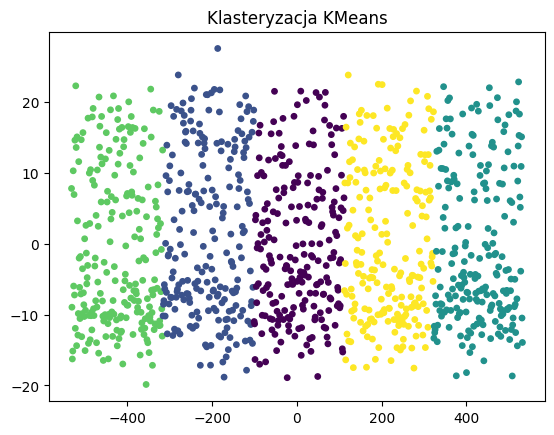

In [43]:
y_kmeans400 = kmeans_plot(df_train400, n_clusters=5)

In [44]:
kmeans_silh400, kmeans_dbi400, kmeans_chs400 = clusterization_scores(df_train400, y_kmeans400)

Silhouette Score: 0.3795272964527041
Davies-Bouldin Index: 0.8121602413182669
Calinski-Harabasz Index: 3020.862184535824


#### features_reduced_598

Teraz ramka danych z 598 kolumnami.

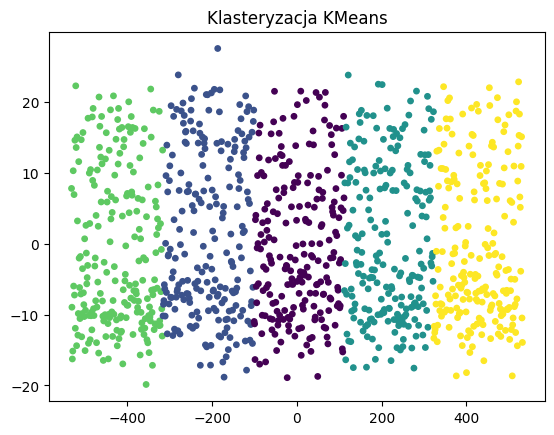

In [45]:
y_kmeans598 = kmeans_plot(df_train598, n_clusters=5)

In [46]:
kmeans_silh598, kmeans_dbi598, kmeans_chs598 = clusterization_scores(df_train598, y_kmeans598)

Silhouette Score: 0.35591155890907245
Davies-Bouldin Index: 0.8698038364013561
Calinski-Harabasz Index: 2673.1850932678262


#### word2vec_features

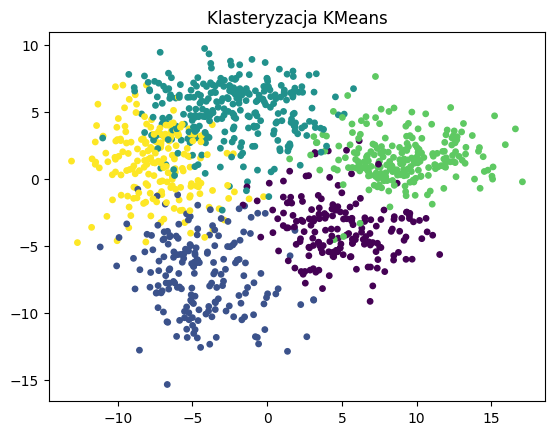

In [47]:
y_kmeans_w2v = kmeans_plot(df_word2vec, n_clusters = 5)

In [48]:
kmeans_silh_w2v, kmeans_dbi_w2v, kmeans_chs_w2v = clusterization_scores(df_word2vec, y_kmeans_w2v)

Silhouette Score: 0.12477984499808352
Davies-Bouldin Index: 2.3287222794154445
Calinski-Harabasz Index: 99.4673612620133


<font color="green">Widzimy, że punkty na wykresie rzeczywiście rozkładają sie inaczej. Sprawdźmy kolejne tabelki.</font>


#### tfidf_features

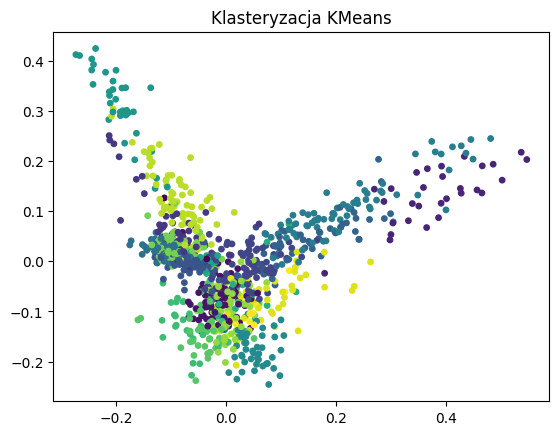

In [49]:
y_kmeans_tfidf = kmeans_plot(df_tfidf, n_clusters = 20)

In [50]:
kmeans_silh_tfidf, kmeans_dbi_tfidf, kmeans_chs_tfidf = clusterization_scores(df_tfidf, y_kmeans_tfidf)

Silhouette Score: 0.02063775708036882
Davies-Bouldin Index: 5.373093750924345
Calinski-Harabasz Index: 5.832339743895912


#### ngram_features

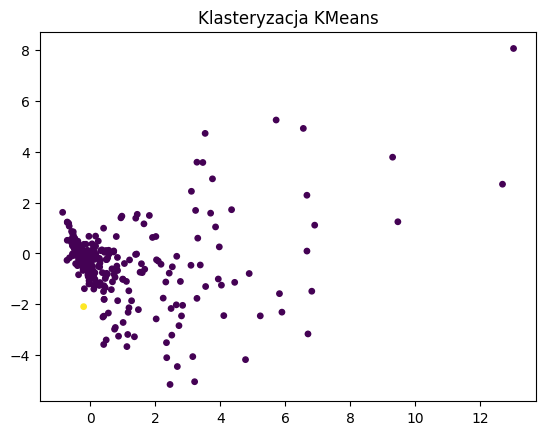

In [51]:
y_kmeans_ngram = kmeans_plot(df_ngram, n_clusters = 2)

In [52]:
kmeans_silh_ngram, kmeans_dbi_ngram, kmeans_chs_ngram = clusterization_scores(df_ngram, y_kmeans_ngram)

Silhouette Score: 0.5941661130963213
Davies-Bouldin Index: 0.28829297618179633
Calinski-Harabasz Index: 9.205511475636941


#### glove_features

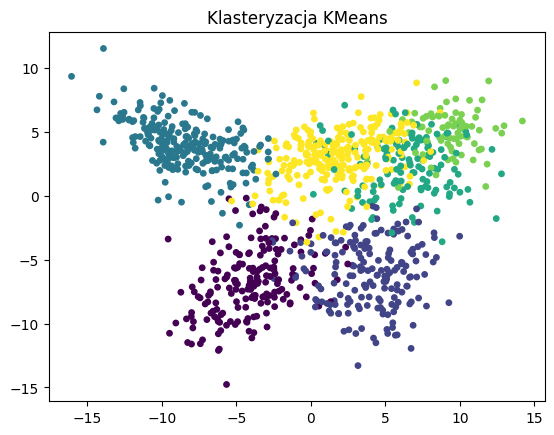

In [53]:
y_kmeans_glove = kmeans_plot(df_glove, n_clusters = 6)

In [54]:
kmeans_silh_glove, kmeans_dbi_glove, kmeans_chs_glove = clusterization_scores(df_glove, y_kmeans_glove)

Silhouette Score: 0.1305791547471038
Davies-Bouldin Index: 2.2888546315312603
Calinski-Harabasz Index: 91.1825832858093


#### Podsumowanie:

In [55]:
kmeans_scores = {
    'Data': ['features_reduced_400', 'features_reduced_598', 'word2vec_features', 'tfidf_features', 'ngram_features', 'glove_features'],
    'Silhouette Score': [kmeans_silh400, kmeans_silh598, kmeans_silh_w2v, kmeans_silh_tfidf, kmeans_silh_ngram, kmeans_silh_glove],
    'Davies-Bouldin Score': [kmeans_dbi400, kmeans_dbi598, kmeans_dbi_w2v, kmeans_dbi_tfidf, kmeans_dbi_ngram, kmeans_dbi_glove],
    'Calinski-Harabasz Score': [kmeans_chs400, kmeans_chs598, kmeans_chs_w2v, kmeans_chs_tfidf, kmeans_chs_ngram, kmeans_chs_glove]
    }

kmeans_scores = pd.DataFrame(kmeans_scores)
print(kmeans_scores)

                   Data  Silhouette Score  Davies-Bouldin Score  \
0  features_reduced_400          0.379527              0.812160   
1  features_reduced_598          0.355912              0.869804   
2     word2vec_features          0.124780              2.328722   
3        tfidf_features          0.020638              5.373094   
4        ngram_features          0.594166              0.288293   
5        glove_features          0.130579              2.288855   

   Calinski-Harabasz Score  
0              3020.862185  
1              2673.185093  
2                99.467361  
3                 5.832340  
4                 9.205511  
5                91.182583  


### 3.2. DBSCAN

Zajmiemy się teraz klasteryzacja przy użyciu algorytmu DBSCAN. Stworzymy analogiczną funkcję jak dla KMeans.

In [56]:
def dbscan_plot(X, eps=0.5, min_samples=5):
    # inicjalizacja DBSCAN
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    # dopasowanie DBSCAN do danych
    clusters = dbscan.fit_predict(X)

    # redukcja wymiarowości danych do dwóch wymiarów za pomocą PCA dla wizualizacji
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)

    # rysowanie klastrów
    plt.figure(figsize=(8, 6))
    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters, cmap='viridis')
    plt.title('Klasteryzacja DBSCAN')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.colorbar(label='Cluster')
    plt.show()

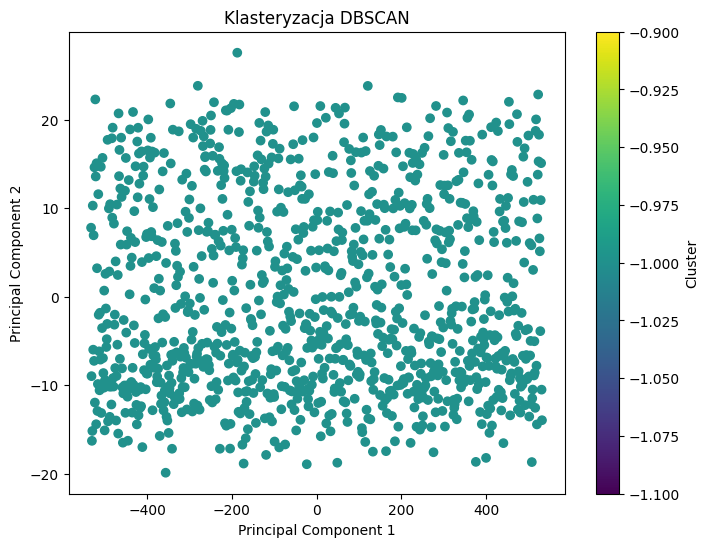

In [57]:
dbscan_plot(df_train400, eps=0.00000000001, min_samples=100)

Teraz dane z 598 kolumnami:

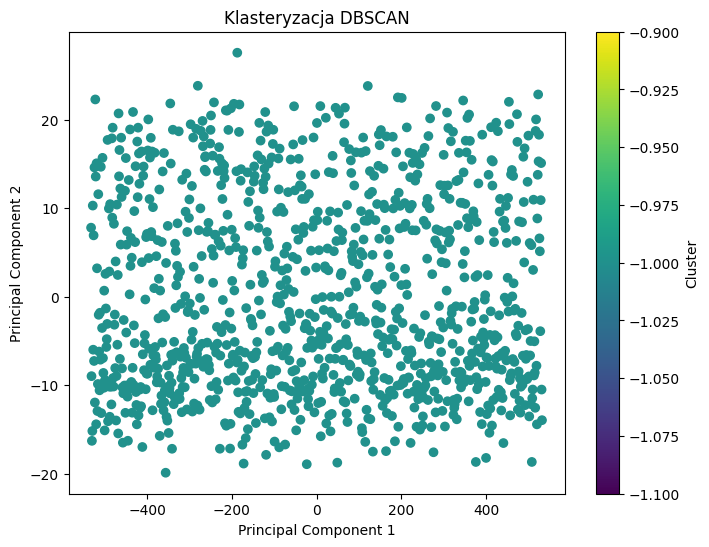

In [58]:
dbscan_plot(df_train598)

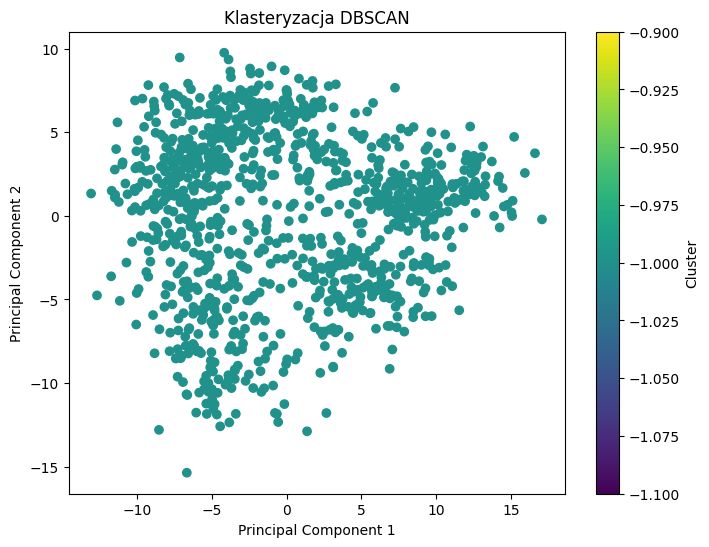

In [59]:
dbscan_plot(df_word2vec)

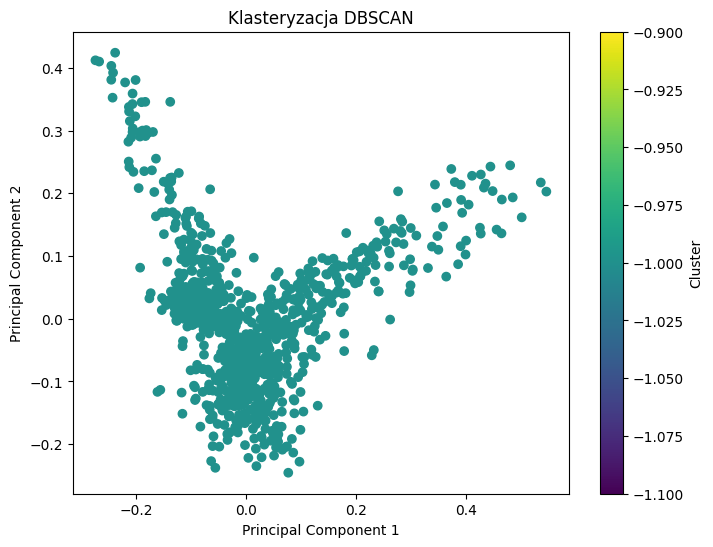

In [60]:
dbscan_plot(df_tfidf)

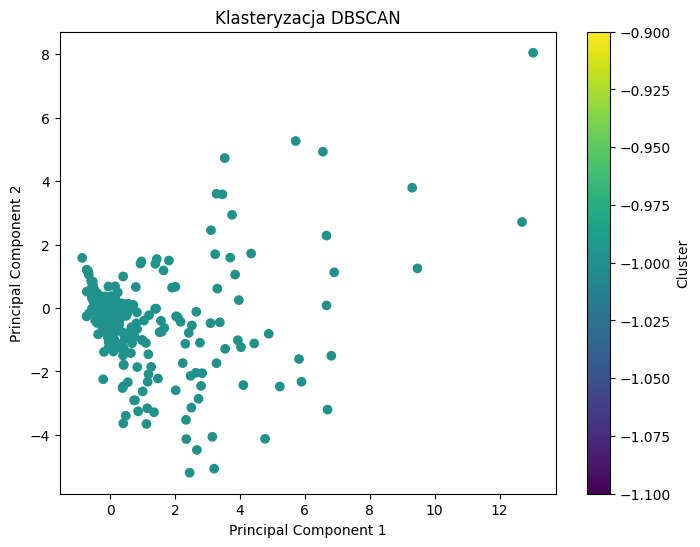

In [61]:
dbscan_plot(df_ngram)

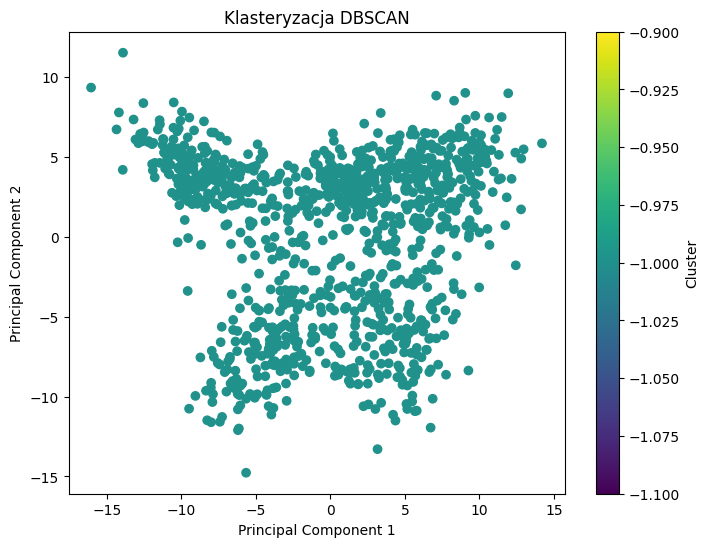

In [62]:
dbscan_plot(df_glove)

Dla tej metody klasteryzacja w ogóle sobie nie radzi. Nie tworzy więcej niż 1 klastra. Nie będziemy więc dalej analizować tego algorytmu.

### 3.3. Klasteryzacja hierarchiczna

Przejdziemy teraz do algorytmów przeprowadzających klasteryzację w sposób hierarchiczny.

#### Hierarchical Agglomerative Clustering (HAC)

Zacznijmy od Hierarchical Agglomerative Clustering (HAC). Przetestujemy różne rodzaje podejść aglomeracyjnych:
- Single Linkage
- Complete Linkage
- Average Linkage
- Centroid Linkage
- Ward's Linkage.

#### Single Linkage

In [63]:
def single_linkage_plot(X, max_clusters=5):
    # Inicjalizacja algorytmu aglomeracyjnego z użyciem single linkage
    model = AgglomerativeClustering(n_clusters=max_clusters, linkage='single')

    # Dopasowanie modelu do danych
    clusters = model.fit_predict(X)

    # Redukcja wymiarowości danych do dwóch wymiarów za pomocą PCA dla wizualizacji
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)

    # Rysowanie klastrów
    plt.figure(figsize=(8, 6))
    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters, cmap='viridis')
    plt.title('Single Linkage Clustering')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.colorbar(label='Cluster')
    plt.show()

    return clusters

##### features_reduced_400

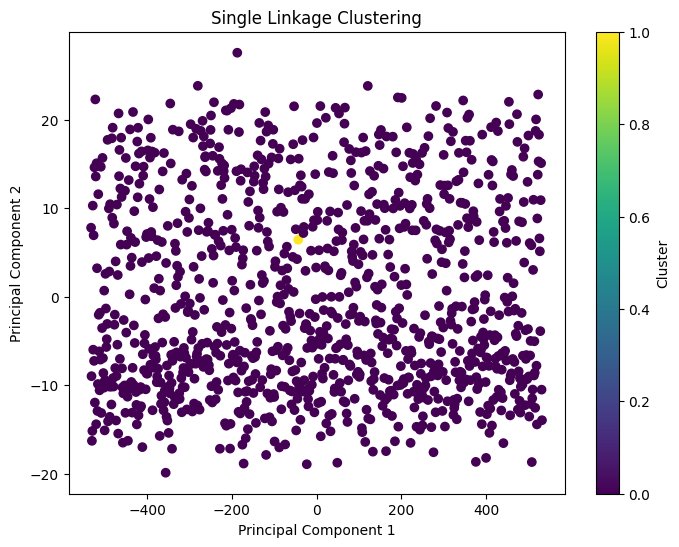

In [64]:
y_sl400 = single_linkage_plot(df_train400, max_clusters=2)

In [65]:
sl_silh400, sl_dbi400, sl_chs400 = clusterization_scores(df_train400, y_sl400)

Silhouette Score: -0.20065355481733338
Davies-Bouldin Index: 2.164111273728908
Calinski-Harabasz Index: 0.16821136280696952


##### features_reduced_598

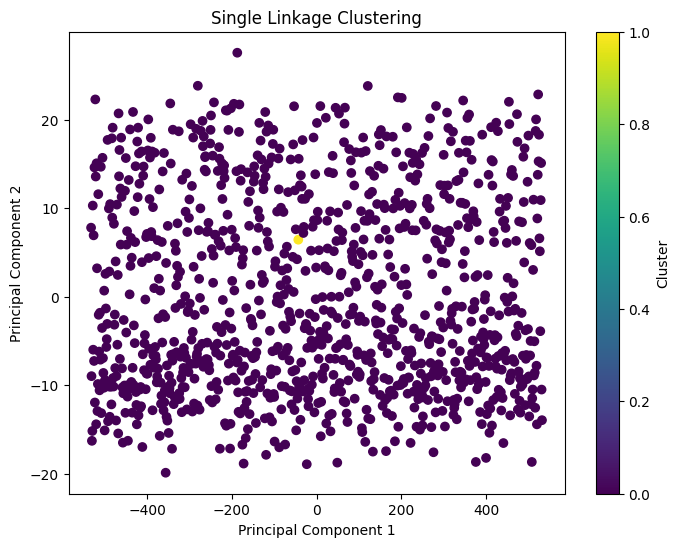

In [66]:
y_sl598 = single_linkage_plot(df_train598, max_clusters=2)

In [67]:
sl_silh598, sl_dbi598, sl_chs598 = clusterization_scores(df_train598, y_sl598)

Silhouette Score: -0.20266973782786205
Davies-Bouldin Index: 2.1741278074358097
Calinski-Harabasz Index: 0.16816386624202706


##### word2vec_features

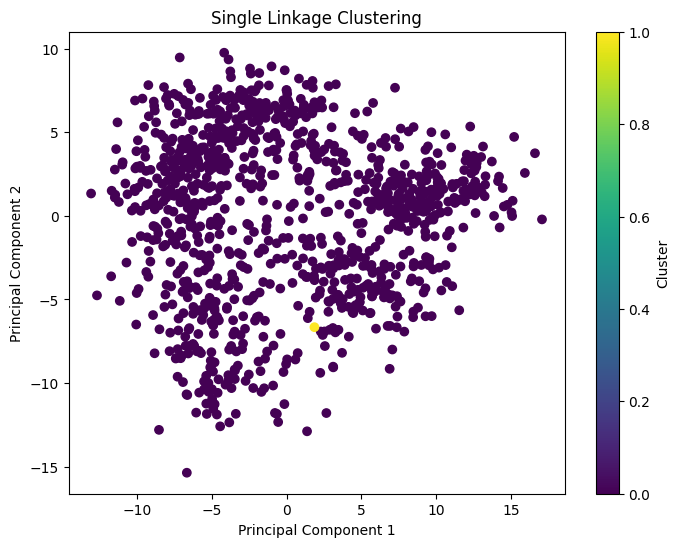

In [68]:
y_sl_w2v = single_linkage_plot(df_word2vec, max_clusters=2)

In [69]:
sl_silh_w2v, sl_dbi_w2v, sl_chs_w2v = clusterization_scores(df_word2vec, y_sl_w2v)

Silhouette Score: 0.15622395090223987
Davies-Bouldin Index: 0.7402666838998778
Calinski-Harabasz Index: 1.7696494883008491


##### tfidf_features

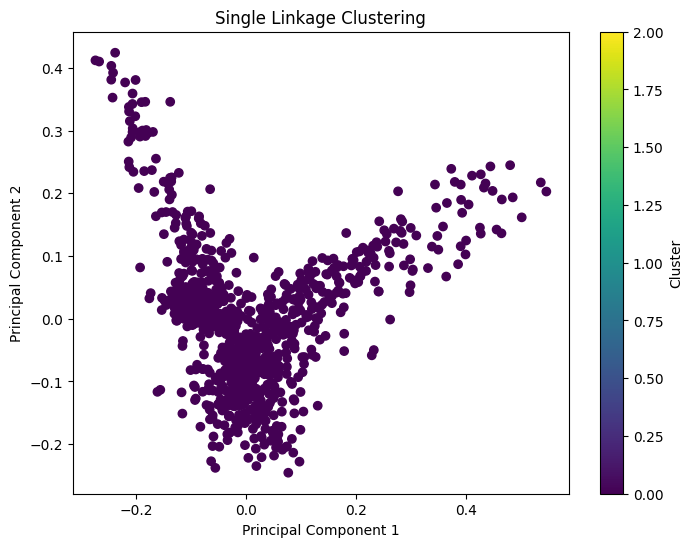

In [70]:
y_sl_tfidf = single_linkage_plot(df_tfidf, max_clusters=3)

In [71]:
sl_silh_tfidf, sl_dbi_tfidf, sl_chs_tfidf = clusterization_scores(df_tfidf, y_sl_tfidf)

Silhouette Score: 0.0054662421858343805
Davies-Bouldin Index: 0.9822125428059797
Calinski-Harabasz Index: 1.035020918934896


##### ngram_features

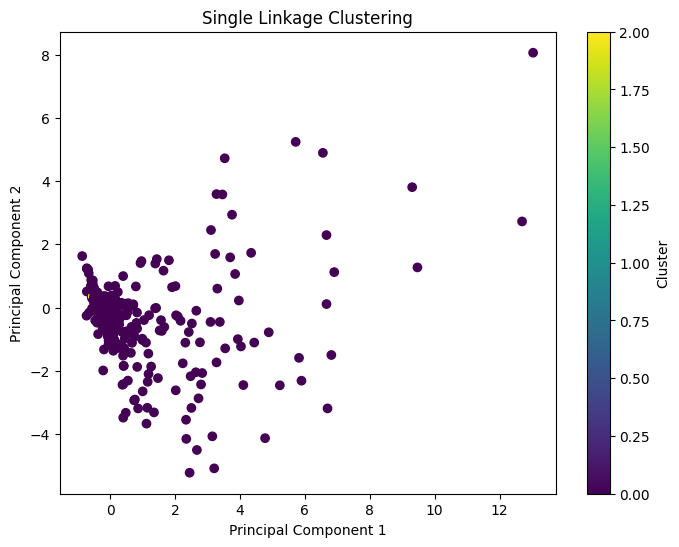

In [72]:
y_sl_ngram = single_linkage_plot(df_ngram, max_clusters=3)

In [73]:
sl_silh_ngram, sl_dbi_ngram, sl_chs_ngram = clusterization_scores(df_ngram, y_sl_ngram)

Silhouette Score: 0.6063270209284716
Davies-Bouldin Index: 0.2730848597992596
Calinski-Harabasz Index: 10.536697778921765


##### glove_features

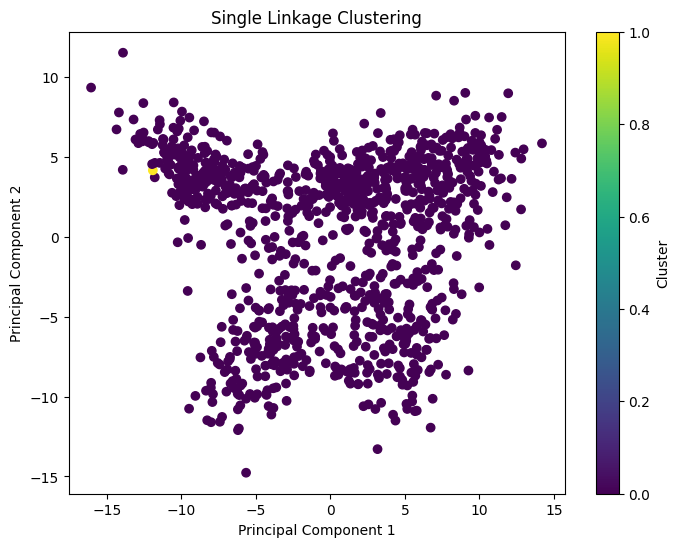

In [74]:
y_sl_glove = single_linkage_plot(df_glove, max_clusters=2)

In [75]:
sl_silh_glove, sl_dbi_glove, sl_chs_glove = clusterization_scores(df_glove, y_sl_glove)

Silhouette Score: 0.3667823659259935
Davies-Bouldin Index: 0.49703635755813946
Calinski-Harabasz Index: 3.8812997388984747


Widać, że ta metoda ogólnie również średnio radzi sobie z klasteryzacją.

##### Podsumowanie

In [76]:
sl_scores = {
    'Data': ['features_reduced_400', 'features_reduced_598', 'word2vec_features', 'tfidf_features', 'ngram_features', 'glove_features'],
    'Silhouette Score': [sl_silh400, sl_silh598, sl_silh_w2v, sl_silh_tfidf, sl_silh_ngram, sl_silh_glove],
    'Davies-Bouldin Score': [sl_dbi400, sl_dbi598, sl_dbi_w2v, sl_dbi_tfidf, sl_dbi_ngram, sl_dbi_glove],
    'Calinski-Harabasz Score': [sl_chs400, sl_chs598, sl_chs_w2v, sl_chs_tfidf, sl_chs_ngram, sl_chs_glove]
    }

sl_scores = pd.DataFrame(sl_scores)
print(sl_scores)

                   Data  Silhouette Score  Davies-Bouldin Score  \
0  features_reduced_400         -0.200654              2.164111   
1  features_reduced_598         -0.202670              2.174128   
2     word2vec_features          0.156224              0.740267   
3        tfidf_features          0.005466              0.982213   
4        ngram_features          0.606327              0.273085   
5        glove_features          0.366782              0.497036   

   Calinski-Harabasz Score  
0                 0.168211  
1                 0.168164  
2                 1.769649  
3                 1.035021  
4                10.536698  
5                 3.881300  


#### Complete Linkage

In [77]:
def complete_linkage_clustering(X, max_clusters):
    """
    Przeprowadza klasteryzację Complete Linkage na danych X.
    
    :param X: przekształcone i zwektoryzowane dane tekstowe
    :param max_clusters: maksymalna liczba klastrów
    :return: przyporządkowane klastry dla każdego punktu danych
    """
    # Przeprowadzenie klasteryzacji Complete Linkage
    clustering = AgglomerativeClustering(n_clusters=max_clusters, linkage='complete')
    labels = clustering.fit_predict(X)

    return labels

def complete_linkage_plot(X, max_clusters):
    """
    Przeprowadza klasteryzację Complete Linkage na danych X i rysuje wykres klastrów.
    
    :param X: przekształcone i zwektoryzowane dane tekstowe
    :param max_clusters: maksymalna liczba klastrów
    """
    labels = complete_linkage_clustering(X, max_clusters)

    # Redukcja wymiarów za pomocą PCA do 2D dla wizualizacji
    pca = PCA(n_components=2)
    X_reduced = pca.fit_transform(X)
    
    plt.figure(figsize=(10, 7))
    plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=labels, cmap='viridis')
    plt.title('Klasteryzacja HAC - Complete Linkage')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.colorbar()
    plt.show()
    return labels


##### features_reduced_400

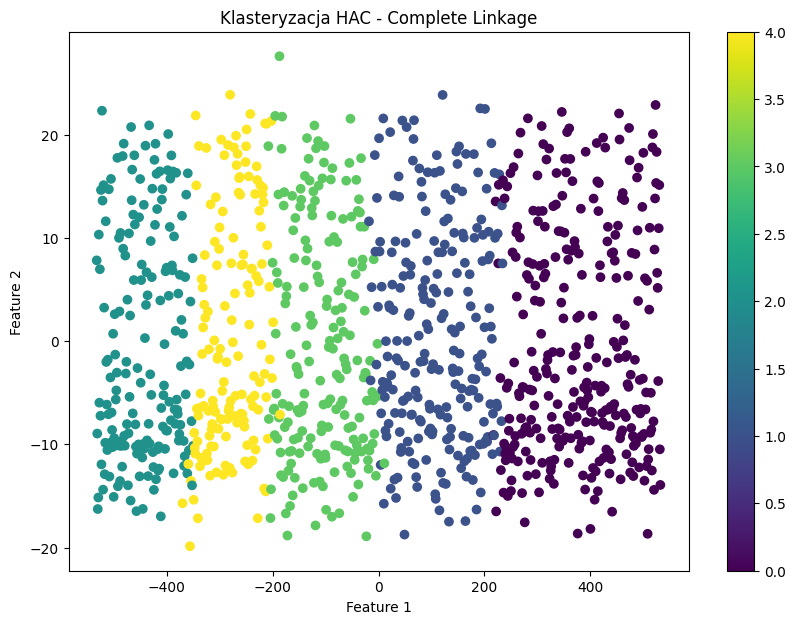

In [78]:
y_cl400 = complete_linkage_plot(df_train400, max_clusters=5)

In [79]:
cl_silh400, cl_dbi400, cl_chs400 = clusterization_scores(df_train400, y_cl400)

Silhouette Score: 0.36812756375207634
Davies-Bouldin Index: 0.8750621817247927
Calinski-Harabasz Index: 2716.080318887938


##### features_reduced_598

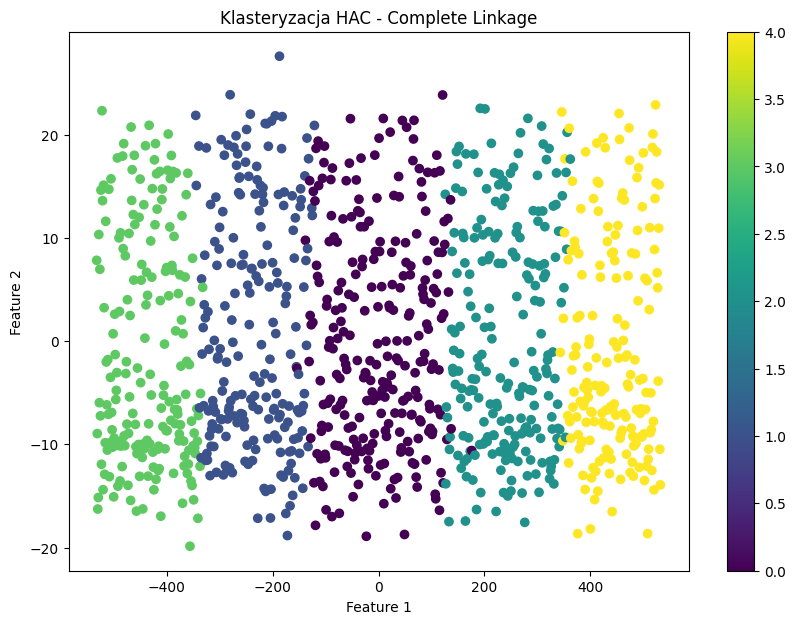

In [80]:
y_cl598 = complete_linkage_plot(df_train598, max_clusters=5)

In [81]:
cl_silh598, cl_dbi598, cl_chs598 = clusterization_scores(df_train598, y_cl598)

Silhouette Score: 0.3447840501101267
Davies-Bouldin Index: 0.8891837399948415
Calinski-Harabasz Index: 2585.2916104097717


##### word2vec_features

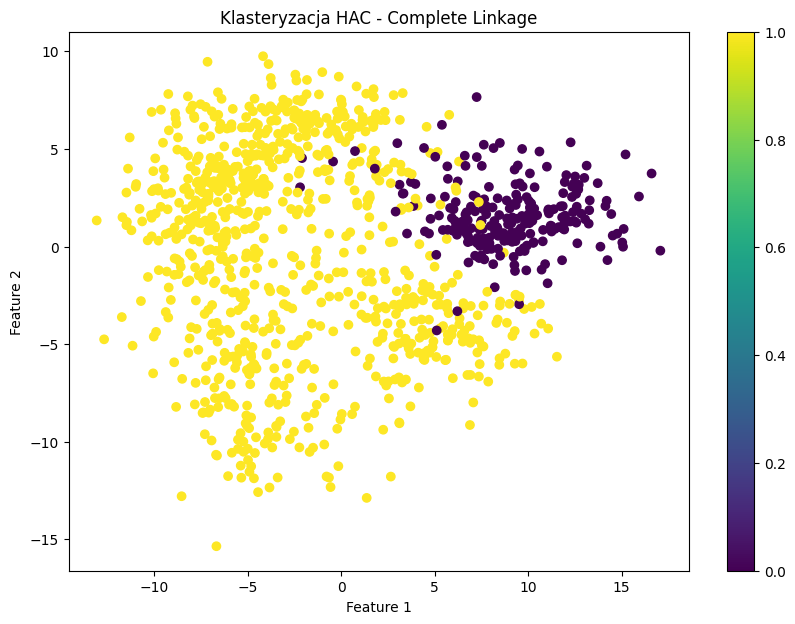

In [82]:
y_cl_w2v = complete_linkage_plot(df_word2vec, max_clusters=2)

In [83]:
cl_silh_w2v, cl_dbi_w2v, cl_chs_w2v = clusterization_scores(df_word2vec, y_cl_w2v)

Silhouette Score: 0.10222081488387383
Davies-Bouldin Index: 2.3652192228996416
Calinski-Harabasz Index: 112.01939299325001


##### tfidf_features

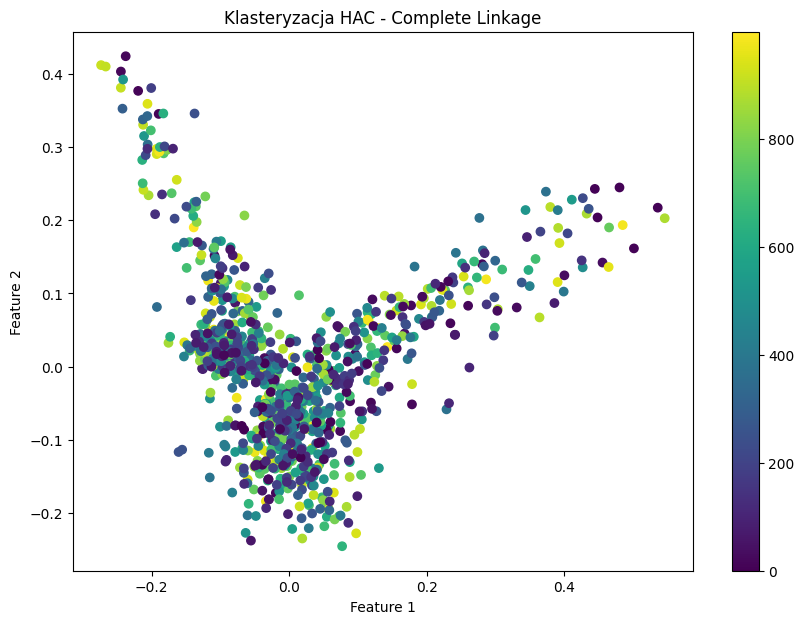

In [84]:
y_cl_tfidf = complete_linkage_plot(df_tfidf, max_clusters=1000)

In [85]:
cl_silh_tfidf, cl_dbi_tfidf, cl_chs_tfidf = clusterization_scores(df_tfidf, y_cl_tfidf)

Silhouette Score: 0.052960557344473566
Davies-Bouldin Index: 0.3684255247044538
Calinski-Harabasz Index: 5.366184655388292


##### ngram_features

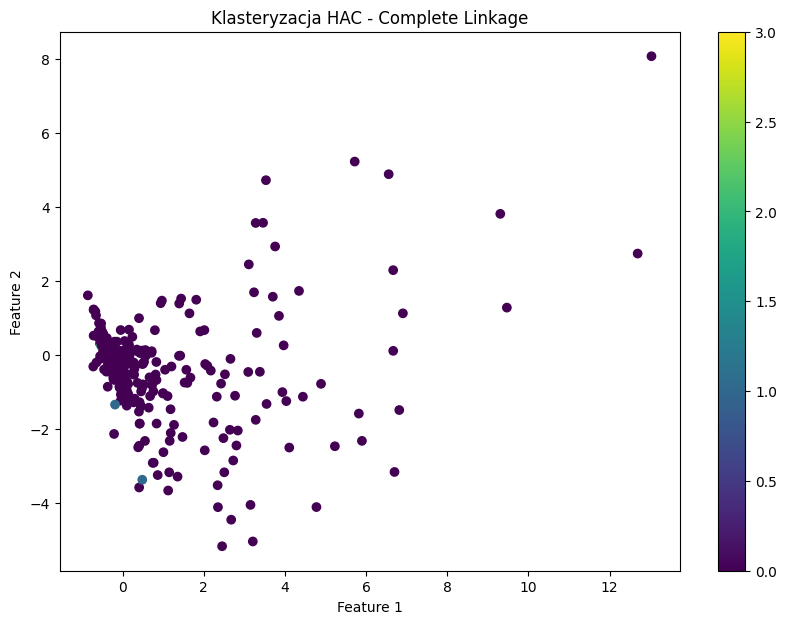

In [86]:
y_cl_ngram = complete_linkage_plot(df_ngram, max_clusters=4)

In [87]:
cl_silh_ngram, cl_dbi_ngram, cl_chs_ngram = clusterization_scores(df_ngram, y_cl_ngram)

Silhouette Score: 0.5724420797848668
Davies-Bouldin Index: 0.5237323108355387
Calinski-Harabasz Index: 11.913514750666005


##### glove_features

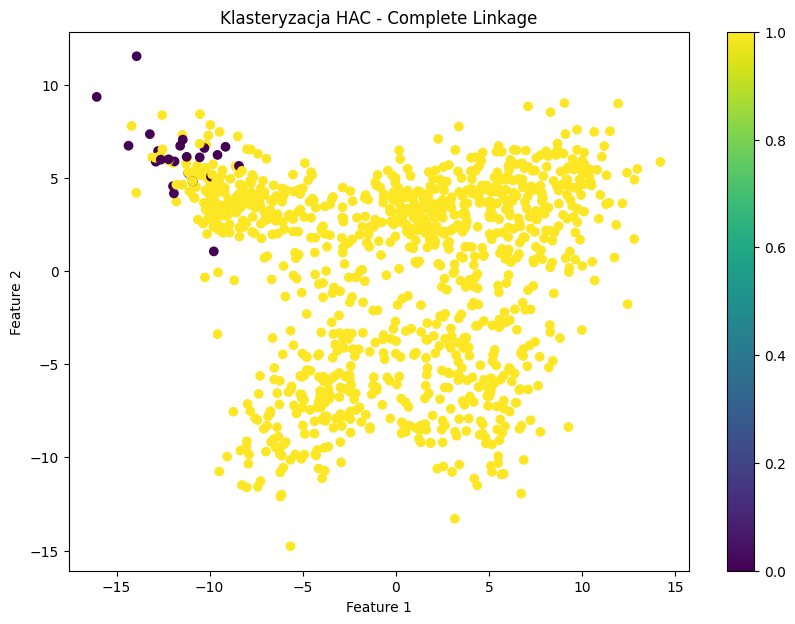

In [88]:
y_cl_glove = complete_linkage_plot(df_glove, max_clusters=2)

In [89]:
cl_silh_glove, cl_dbi_glove, cl_chs_glove = clusterization_scores(df_glove, y_cl_glove)

Silhouette Score: 0.23454010088923635
Davies-Bouldin Index: 1.9785649305384847
Calinski-Harabasz Index: 24.844636371091024


##### Podsumowanie

In [90]:
cl_scores = {
    'Data': ['features_reduced_400', 'features_reduced_598', 'word2vec_features', 'tfidf_features', 'ngram_features', 'glove_features'],
    'Silhouette Score': [cl_silh400, cl_silh598, cl_silh_w2v, cl_silh_tfidf, cl_silh_ngram, cl_silh_glove],
    'Davies-Bouldin Score': [cl_dbi400, cl_dbi598, cl_dbi_w2v, cl_dbi_tfidf, cl_dbi_ngram, cl_dbi_glove],
    'Calinski-Harabasz Score': [cl_chs400, cl_chs598, cl_chs_w2v, cl_chs_tfidf, cl_chs_ngram, cl_chs_glove]
    }

cl_scores = pd.DataFrame(cl_scores)
print(cl_scores)

                   Data  Silhouette Score  Davies-Bouldin Score  \
0  features_reduced_400          0.368128              0.875062   
1  features_reduced_598          0.344784              0.889184   
2     word2vec_features          0.102221              2.365219   
3        tfidf_features          0.052961              0.368426   
4        ngram_features          0.572442              0.523732   
5        glove_features          0.234540              1.978565   

   Calinski-Harabasz Score  
0              2716.080319  
1              2585.291610  
2               112.019393  
3                 5.366185  
4                11.913515  
5                24.844636  


#### Average Linkage

In [91]:
def average_linkage_plot(X, n_clusters=None):
    """
    Przeprowadza klasteryzację Average Linkage i rysuje wykres klastrów.
    
    :param X: przekształcone i zwektoryzowane dane tekstowe
    :param n_clusters: liczba klastrów
    """
    # Klasteryzacja Average Linkage
    model = AgglomerativeClustering(n_clusters=n_clusters, linkage='average')
    labels = model.fit_predict(X)
    
    # Redukcja wymiarów za pomocą PCA do 2D dla wizualizacji
    pca = PCA(n_components=2)
    X_reduced = pca.fit_transform(X)
    
    # Rysowanie wykresu klastrów
    plt.figure(figsize=(10, 7))
    for i in range(n_clusters):
        plt.scatter(X_reduced[labels == i, 0], X_reduced[labels == i, 1], label=f'Cluster {i+1}')
    
    plt.title('Klasteryzacja HAC - Average Linkage')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.legend()
    plt.show()
    
    return labels

##### features_reduced_400

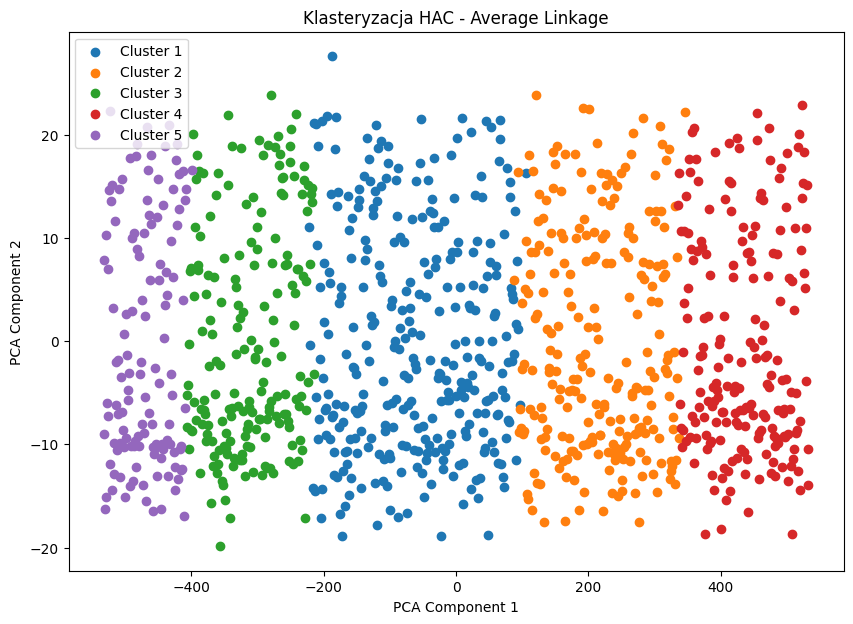

In [92]:
y_al400 = average_linkage_plot(df_train400, n_clusters=5)

In [93]:
al_silh400, al_dbi400, al_chs400 = clusterization_scores(df_train400, y_al400)

Silhouette Score: 0.35260919336148316
Davies-Bouldin Index: 0.866239777613328
Calinski-Harabasz Index: 2653.824874804779


##### features_reduced_598

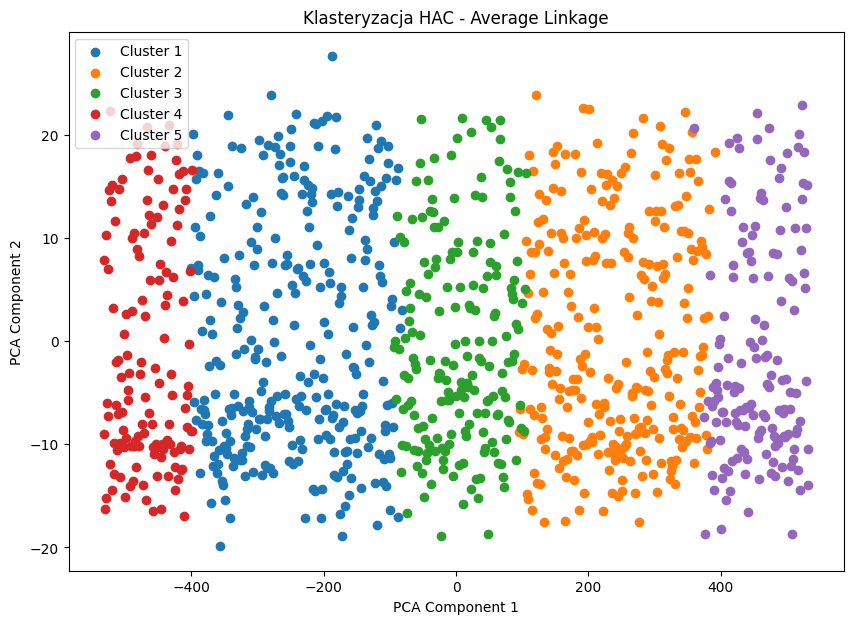

In [94]:
y_al598 = average_linkage_plot(df_train598, n_clusters=5)

In [95]:
al_silh598, al_dbi598, al_chs598 = clusterization_scores(df_train598, y_al598)

Silhouette Score: 0.312213028384713
Davies-Bouldin Index: 0.8574959480596862
Calinski-Harabasz Index: 2301.509877360278


##### word2vec_features

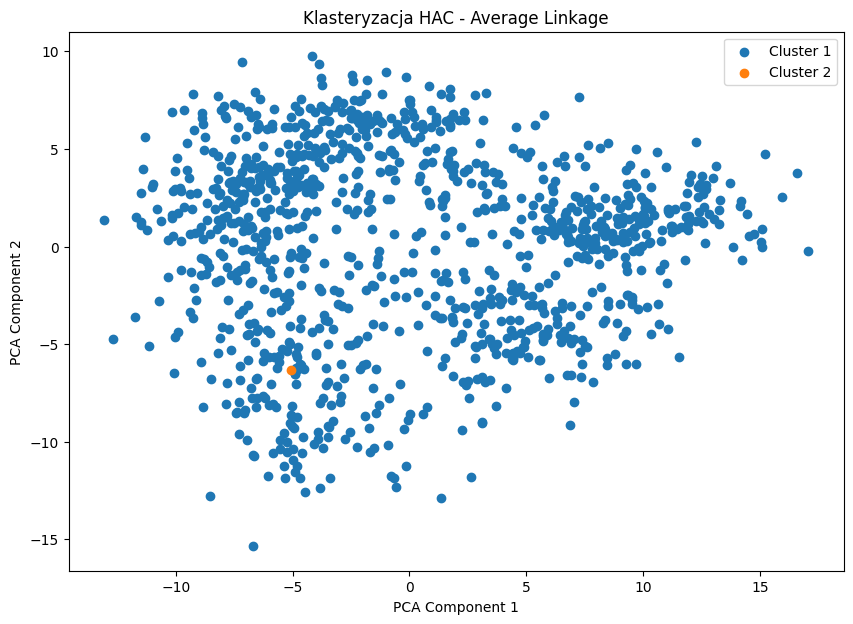

In [96]:
y_al_w2v = average_linkage_plot(df_word2vec, n_clusters=2)

In [97]:
al_silh_w2v, al_dbi_w2v, al_chs_w2v = clusterization_scores(df_word2vec, y_al_w2v)

Silhouette Score: 0.23525164527999495
Davies-Bouldin Index: 0.6400544763918341
Calinski-Harabasz Index: 2.36754528194281


##### tfidf_features

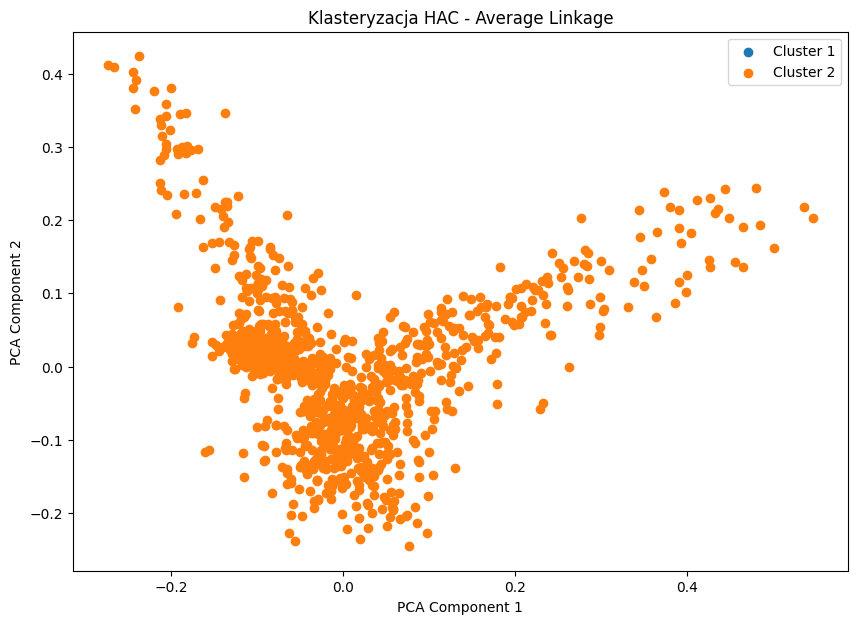

In [98]:
y_al_tfidf = average_linkage_plot(df_tfidf, n_clusters=2)

In [99]:
al_silh_tfidf, al_dbi_tfidf, al_chs_tfidf = clusterization_scores(df_tfidf, y_al_tfidf)

Silhouette Score: 0.010802060596689452
Davies-Bouldin Index: 3.8213721818095108
Calinski-Harabasz Index: 1.2212015133658483


##### ngram_features

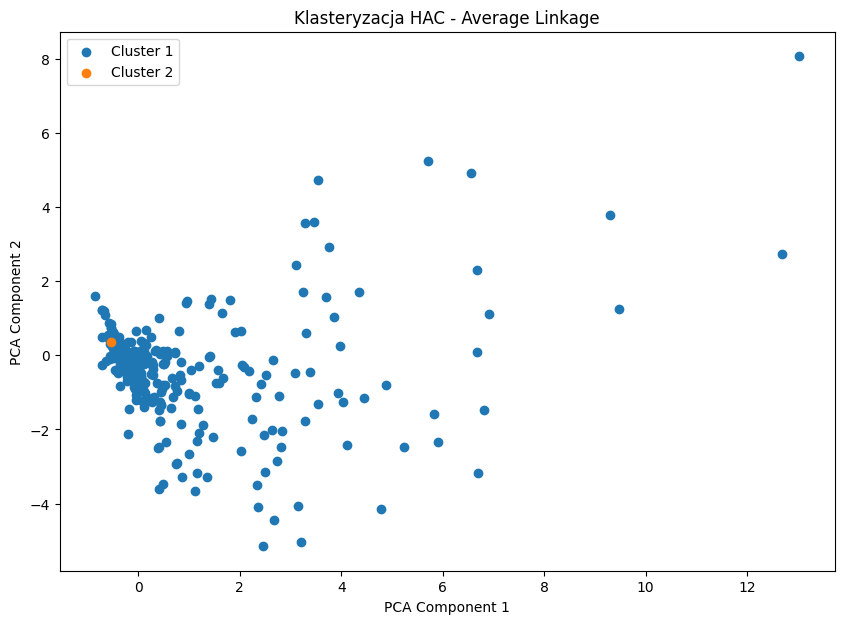

In [100]:
y_al_ngram = average_linkage_plot(df_ngram, n_clusters=2)

In [101]:
al_silh_ngram, al_dbi_ngram, al_chs_ngram = clusterization_scores(df_ngram, y_al_ngram)

Silhouette Score: 0.6263561008466133
Davies-Bouldin Index: 0.2631307310791852
Calinski-Harabasz Index: 11.062535013071606


##### glove_features

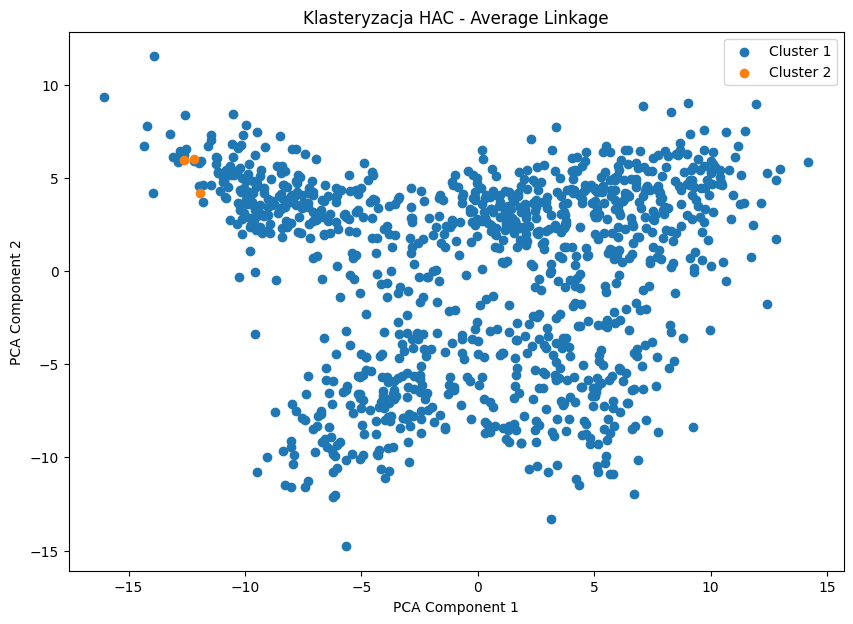

In [102]:
y_al_glove = average_linkage_plot(df_glove, n_clusters=2)

In [103]:
al_silh_glove, al_dbi_glove, al_chs_glove = clusterization_scores(df_glove, y_al_glove)

Silhouette Score: 0.32762649947700767
Davies-Bouldin Index: 1.1278167823233094
Calinski-Harabasz Index: 7.784957531662415


##### Podsumowanie

In [104]:
al_scores = {
    'Data': ['features_reduced_400', 'features_reduced_598', 'word2vec_features', 'tfidf_features', 'ngram_features', 'glove_features'],
    'Silhouette Score': [al_silh400, al_silh598, al_silh_w2v, al_silh_tfidf, al_silh_ngram, al_silh_glove],
    'Davies-Bouldin Score': [al_dbi400, al_dbi598, al_dbi_w2v, al_dbi_tfidf, al_dbi_ngram, al_dbi_glove],
    'Calinski-Harabasz Score': [al_chs400, al_chs598, al_chs_w2v, al_chs_tfidf, al_chs_ngram, al_chs_glove]
    }

al_scores = pd.DataFrame(al_scores)
print(al_scores)

                   Data  Silhouette Score  Davies-Bouldin Score  \
0  features_reduced_400          0.352609              0.866240   
1  features_reduced_598          0.312213              0.857496   
2     word2vec_features          0.235252              0.640054   
3        tfidf_features          0.010802              3.821372   
4        ngram_features          0.626356              0.263131   
5        glove_features          0.327626              1.127817   

   Calinski-Harabasz Score  
0              2653.824875  
1              2301.509877  
2                 2.367545  
3                 1.221202  
4                11.062535  
5                 7.784958  


#### Centroid Linkage

In [105]:
def centroid_linkage_plot(X, n_clusters=None):
    """
    Przeprowadza klasteryzację Centroid Linkage i rysuje wykres klastrów.
    
    :param X: przekształcone i zwektoryzowane dane tekstowe
    :param n_clusters: liczba klastrów
    """
    # Klasteryzacja Centroid Linkage
    Z = linkage(X, method='centroid')
    labels = fcluster(Z, n_clusters, criterion='maxclust')
    
    # Redukcja wymiarów za pomocą PCA do 2D dla wizualizacji
    pca = PCA(n_components=2)
    X_reduced = pca.fit_transform(X)
    
    # Rysowanie wykresu klastrów
    plt.figure(figsize=(10, 7))
    for i in range(1, n_clusters + 1):
        plt.scatter(X_reduced[labels == i, 0], X_reduced[labels == i, 1], label=f'Cluster {i}')
    
    plt.title('Klasteryzacja HAC - Centroid Linkage')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.legend()
    plt.show()

    return labels

##### features_reduced_400

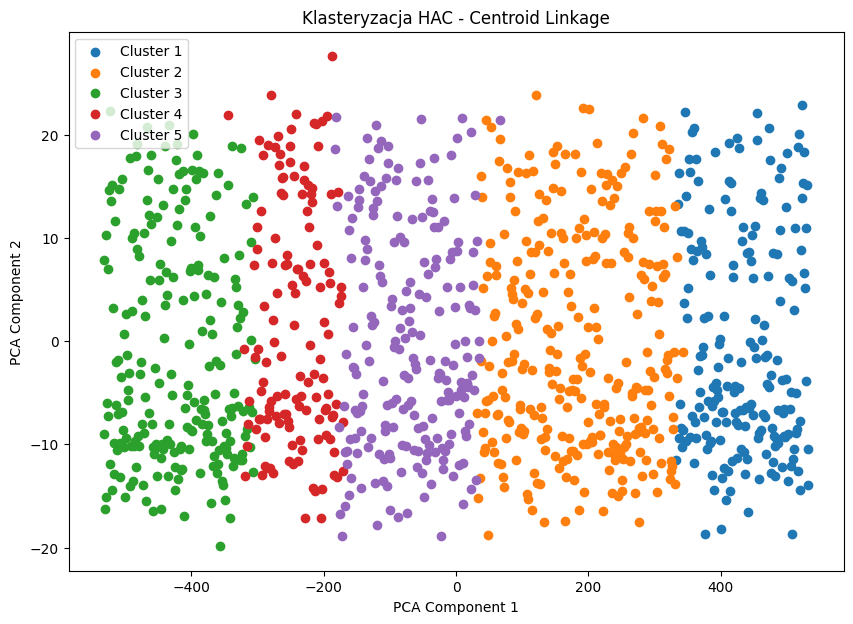

In [106]:
y_ctrl400 = centroid_linkage_plot(df_train400, n_clusters=5)

In [107]:
ctrl_silh400, ctrl_dbi400, ctrl_chs400 = clusterization_scores(df_train400, y_ctrl400)

Silhouette Score: 0.3506958156653612
Davies-Bouldin Index: 0.8508925140080617
Calinski-Harabasz Index: 2729.998664640437


##### features_reduced_598

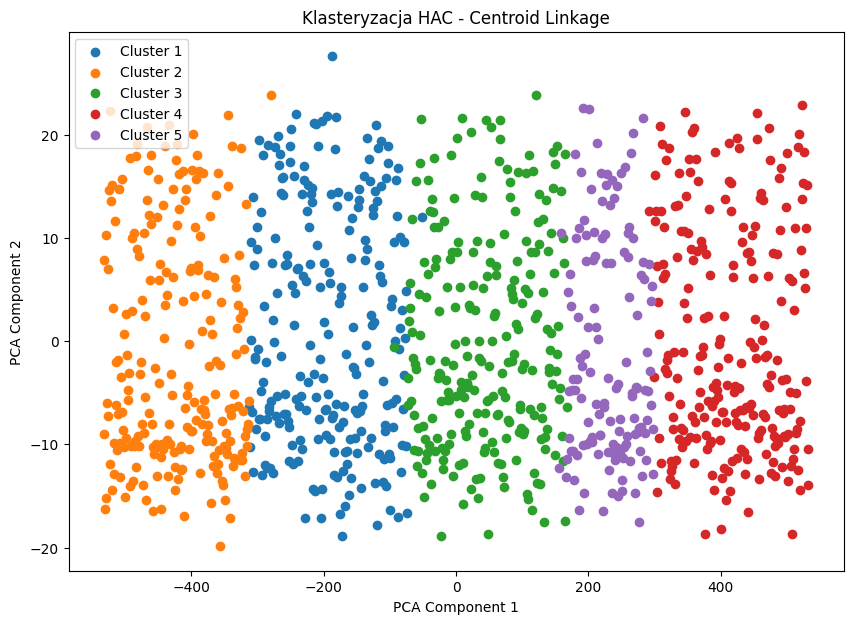

In [108]:
y_ctrl598 = centroid_linkage_plot(df_train598, n_clusters=5)

In [109]:
ctrl_silh598, ctrl_dbi598, ctrl_chs598 = clusterization_scores(df_train598, y_ctrl598)

Silhouette Score: 0.33465169301105147
Davies-Bouldin Index: 0.9077712445930937
Calinski-Harabasz Index: 2544.133566697949


##### word2vec_features

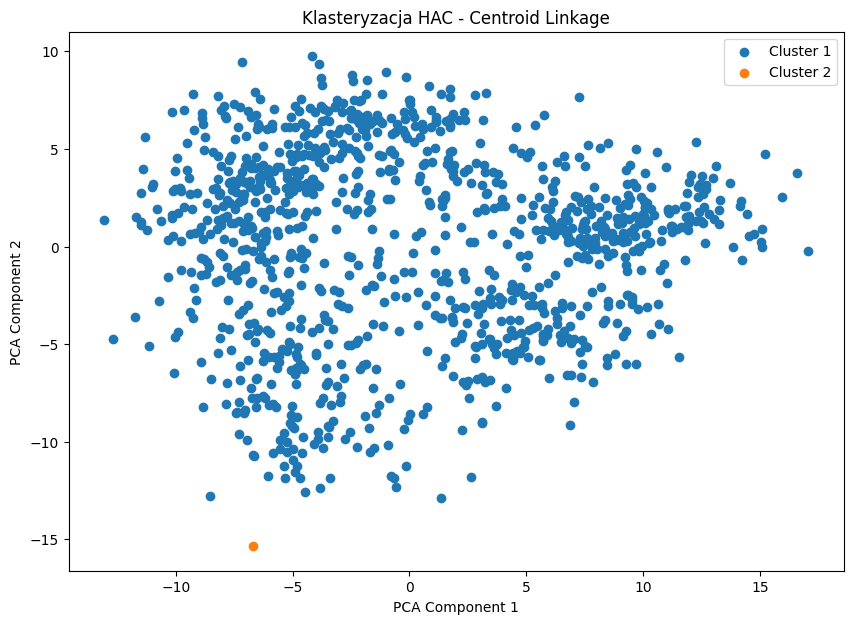

In [110]:
y_ctrl_w2v = centroid_linkage_plot(df_word2vec, n_clusters=2)

In [111]:
ctrl_silh_w2v, ctrl_dbi_w2v, ctrl_chs_w2v = clusterization_scores(df_word2vec, y_ctrl_w2v)

Silhouette Score: 0.2616573672038012
Davies-Bouldin Index: 0.6018868918496398
Calinski-Harabasz Index: 2.677603652733405


##### tfidf_features

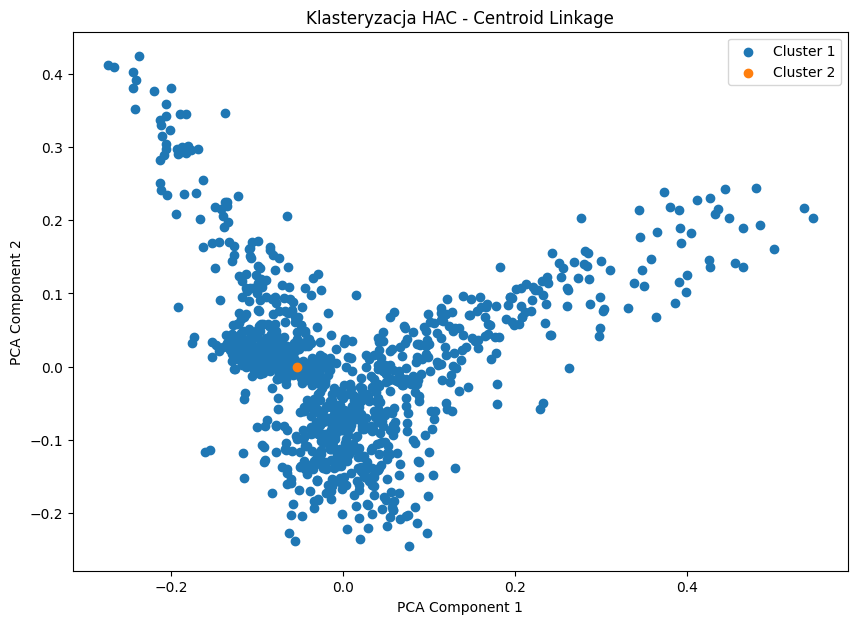

In [112]:
y_ctrl_tfidf = centroid_linkage_plot(df_tfidf, n_clusters=2)

In [113]:
ctrl_silh_tfidf, ctrl_dbi_tfidf, ctrl_chs_tfidf = clusterization_scores(df_tfidf, y_ctrl_tfidf)

Silhouette Score: 0.012843096637901532
Davies-Bouldin Index: 0.9741687636490476
Calinski-Harabasz Index: 1.0516453198615268


##### ngram_features

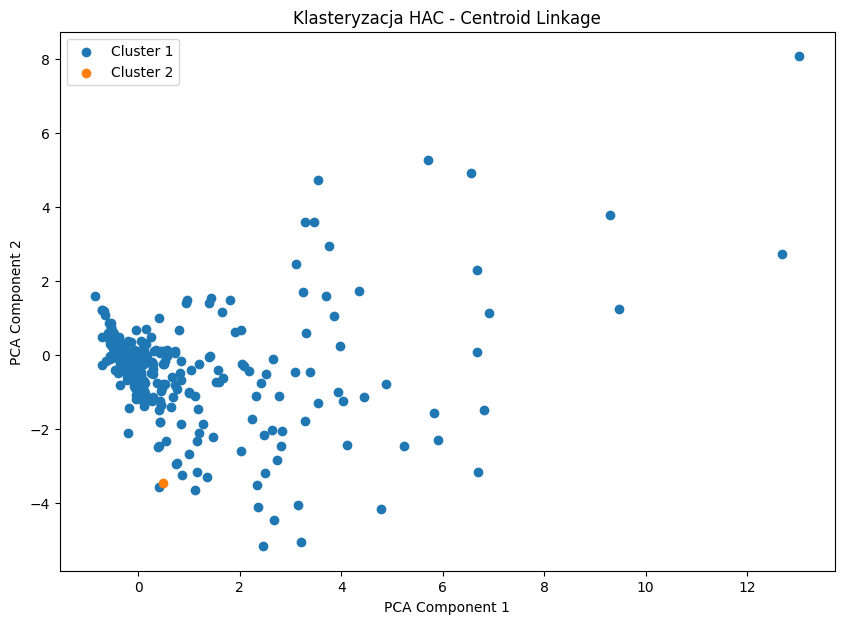

In [114]:
y_ctrl_ngram = centroid_linkage_plot(df_ngram, n_clusters=2)

In [115]:
ctrl_silh_ngram, ctrl_dbi_ngram, ctrl_chs_ngram = clusterization_scores(df_ngram, y_ctrl_ngram)

Silhouette Score: 0.6356389904061786
Davies-Bouldin Index: 0.25563964670958633
Calinski-Harabasz Index: 11.72467713323504


##### glove_features

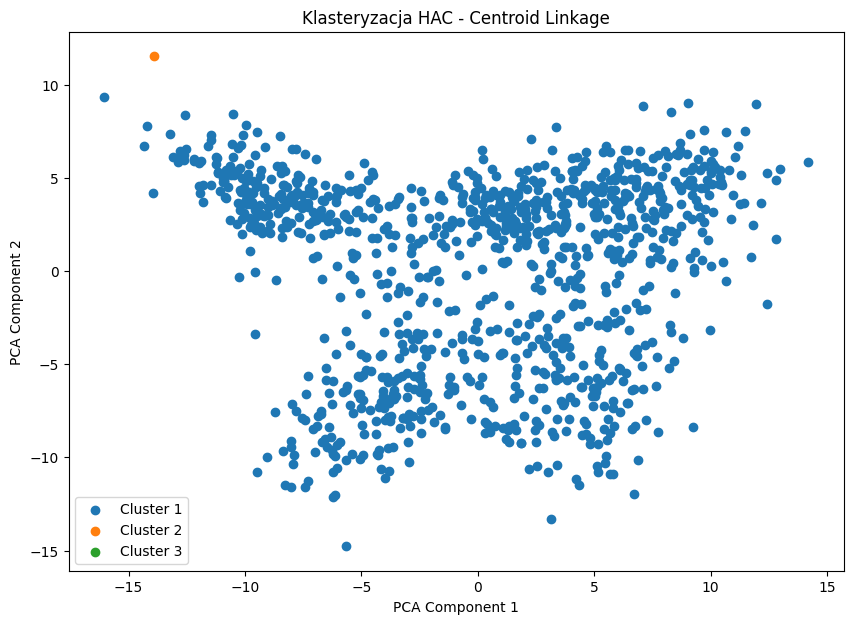

In [116]:
y_ctrl_glove = centroid_linkage_plot(df_glove, n_clusters=3)

In [117]:
ctrl_silh_glove, ctrl_dbi_glove, ctrl_chs_glove = clusterization_scores(df_glove, y_ctrl_glove)

Silhouette Score: 0.3629514907222504
Davies-Bouldin Index: 0.4967727526712764
Calinski-Harabasz Index: 3.8853448622866287


##### Podsumowanie

In [118]:
ctrl_scores = {
    'Data': ['features_reduced_400', 'features_reduced_598', 'word2vec_features', 'tfidf_features', 'ngram_features', 'glove_features'],
    'Silhouette Score': [ctrl_silh400, ctrl_silh598, ctrl_silh_w2v, ctrl_silh_tfidf, ctrl_silh_ngram, ctrl_silh_glove],
    'Davies-Bouldin Score': [ctrl_dbi400, ctrl_dbi598, ctrl_dbi_w2v, ctrl_dbi_tfidf, ctrl_dbi_ngram, ctrl_dbi_glove],
    'Calinski-Harabasz Score': [ctrl_chs400, ctrl_chs598, ctrl_chs_w2v, ctrl_chs_tfidf, ctrl_chs_ngram, ctrl_chs_glove]
    }

ctrl_scores = pd.DataFrame(ctrl_scores)
print(ctrl_scores)

                   Data  Silhouette Score  Davies-Bouldin Score  \
0  features_reduced_400          0.350696              0.850893   
1  features_reduced_598          0.334652              0.907771   
2     word2vec_features          0.261657              0.601887   
3        tfidf_features          0.012843              0.974169   
4        ngram_features          0.635639              0.255640   
5        glove_features          0.362951              0.496773   

   Calinski-Harabasz Score  
0              2729.998665  
1              2544.133567  
2                 2.677604  
3                 1.051645  
4                11.724677  
5                 3.885345  


#### Ward's Linkage

In [119]:
def ward_linkage_plot(X, n_clusters=None, distance_threshold=None, linkage_method='ward'):
    """
    Przeprowadza hierarchiczną klasteryzację aglomeracyjną i rysuje dendrogram.
    
    :param X: przekształcone i zwektoryzowane dane tekstowe (np. TF-IDF lub embeddings)
    :param n_clusters: liczba klastrów (opcjonalnie, jeśli chcemy określić liczbę klastrów)
    :param distance_threshold: próg odległości dla tworzenia klastrów (jeśli nie podano n_clusters)
    :param linkage_method: metoda łączenia klastrów ('ward', 'single', 'complete', 'average')
    """
    # Przeprowadzenie hierarchicznej klasteryzacji aglomeracyjnej
    hac = AgglomerativeClustering(n_clusters=n_clusters, 
                                  distance_threshold=distance_threshold, 
                                  metric='euclidean', 
                                  linkage=linkage_method)
    hac.fit(X)
    
    labels = hac.labels_

    
    # Redukcja wymiarowości danych do dwóch wymiarów za pomocą PCA dla wizualizacji
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)
    
    # Rysowanie klastrów
    plt.figure(figsize=(8, 6))
    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=hac.labels_, cmap='viridis')
    plt.title('Klasteryzacja HAC - Wards Linkage')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.colorbar(label='Cluster')
    plt.show()

    return labels


##### features_reduced_400

Najpierw dane z 400 kolumnami.

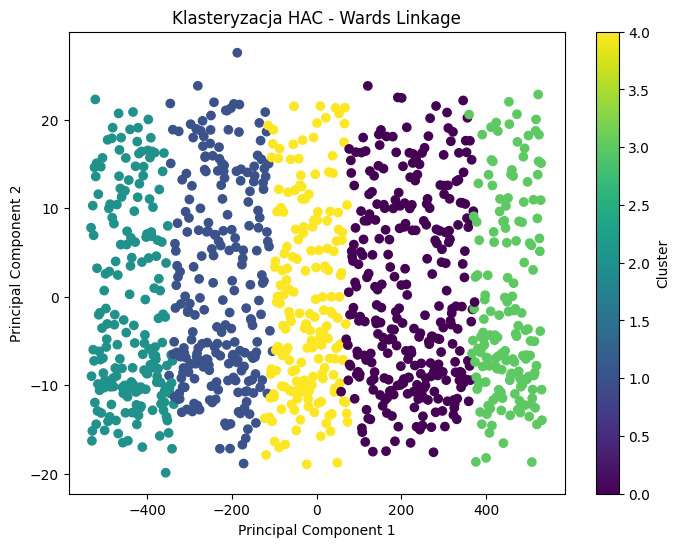

In [120]:
y_wl400 = ward_linkage_plot(df_train400, n_clusters=5)

In [121]:
wl_silh400, wl_dbi400, wl_chs400 = clusterization_scores(df_train400, y_wl400)

Silhouette Score: 0.3567411700619514
Davies-Bouldin Index: 0.8096013214322781
Calinski-Harabasz Index: 2784.045186458286


##### features_reduced_598

Teraz dane z 598 kolumnami:

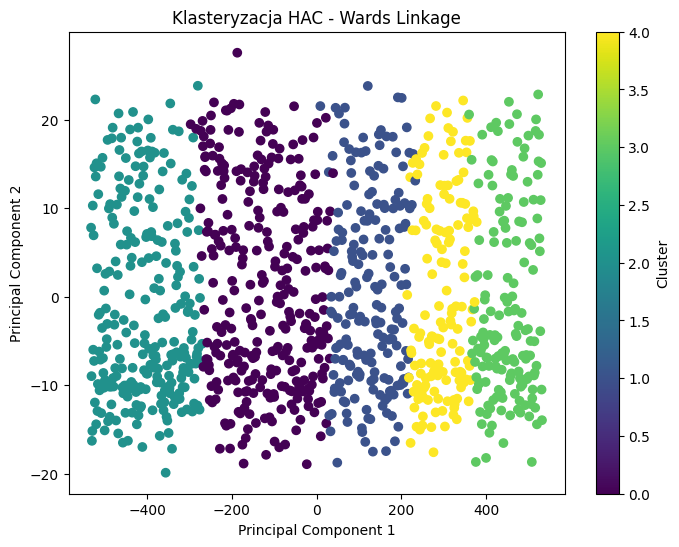

In [122]:
y_wl598 = ward_linkage_plot(df_train598, n_clusters=5)

In [123]:
wl_silh598, wl_dbi598, wl_chs598 = clusterization_scores(df_train598, y_wl598)

Silhouette Score: 0.343767246141892
Davies-Bouldin Index: 0.9430753676586754
Calinski-Harabasz Index: 2385.90133258496


##### word2vec_features

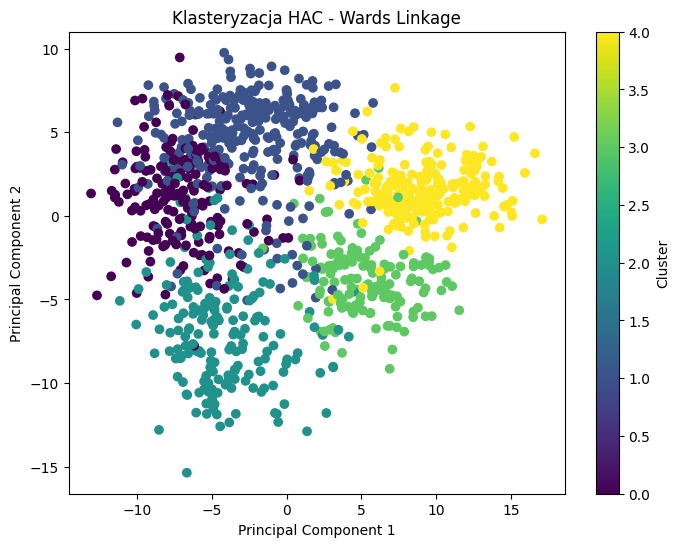

In [124]:
y_wl_w2v = ward_linkage_plot(df_word2vec, n_clusters=5)

In [125]:
wl_silh_w2v, wl_dbi_w2v, wl_chs_w2v = clusterization_scores(df_word2vec, y_wl_w2v)

Silhouette Score: 0.1149859976512412
Davies-Bouldin Index: 2.4075666598687597
Calinski-Harabasz Index: 93.51208823626959


##### tfidf_features

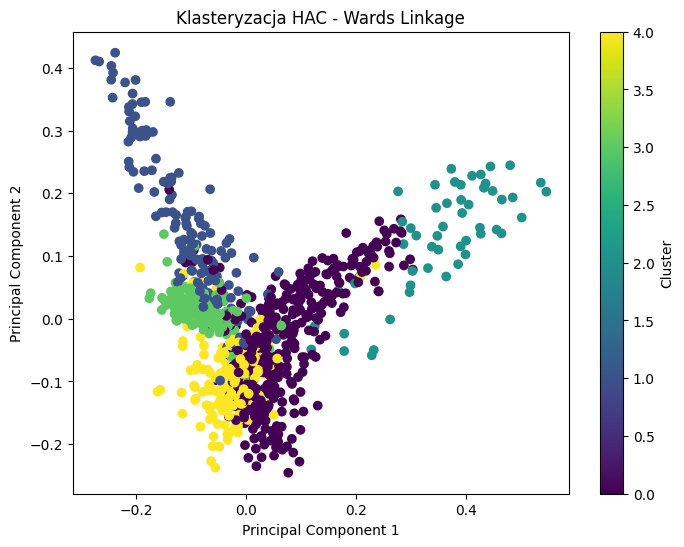

In [126]:
y_wl_tfidf = ward_linkage_plot(df_tfidf, n_clusters=5)

In [127]:
wl_silh_tfidf, wl_dbi_tfidf, wl_chs_tfidf = clusterization_scores(df_tfidf, y_wl_tfidf)

Silhouette Score: 0.010281670425500732
Davies-Bouldin Index: 7.014631968799419
Calinski-Harabasz Index: 9.646194371714289


##### ngram_features

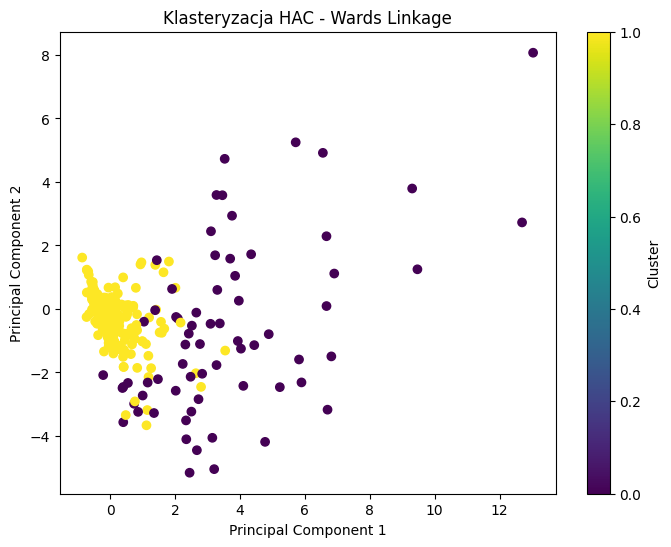

In [128]:
y_wl_ngram = ward_linkage_plot(df_ngram, n_clusters=2)

In [129]:
wl_silh_ngram, wl_dbi_ngram, wl_chs_ngram = clusterization_scores(df_ngram, y_wl_ngram)

Silhouette Score: 0.3424914224179138
Davies-Bouldin Index: 3.2568934685426383
Calinski-Harabasz Index: 34.14703809353619


##### glove_features

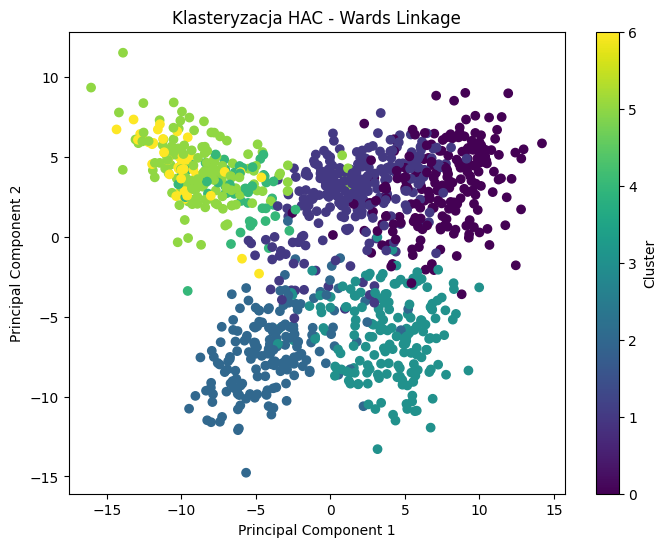

In [130]:
y_wl_glove = ward_linkage_plot(df_glove, n_clusters=7)

In [131]:
wl_silh_glove, wl_dbi_glove, wl_chs_glove = clusterization_scores(df_glove, y_wl_glove)

Silhouette Score: 0.1279437003097699
Davies-Bouldin Index: 2.192827125804849
Calinski-Harabasz Index: 80.4103688799912


##### Podsumowanie

In [132]:
wl_scores = {
    'Data': ['features_reduced_400', 'features_reduced_598', 'word2vec_features', 'tfidf_features', 'ngram_features', 'glove_features'],
    'Silhouette Score': [wl_silh400, wl_silh598, wl_silh_w2v, wl_silh_tfidf, wl_silh_ngram, wl_silh_glove],
    'Davies-Bouldin Score': [wl_dbi400, wl_dbi598, wl_dbi_w2v, wl_dbi_tfidf, wl_dbi_ngram, wl_dbi_glove],
    'Calinski-Harabasz Score': [wl_chs400, wl_chs598, wl_chs_w2v, wl_chs_tfidf, wl_chs_ngram, wl_chs_glove]
    }

wl_scores = pd.DataFrame(wl_scores)
print(wl_scores)

                   Data  Silhouette Score  Davies-Bouldin Score  \
0  features_reduced_400          0.356741              0.809601   
1  features_reduced_598          0.343767              0.943075   
2     word2vec_features          0.114986              2.407567   
3        tfidf_features          0.010282              7.014632   
4        ngram_features          0.342491              3.256893   
5        glove_features          0.127944              2.192827   

   Calinski-Harabasz Score  
0              2784.045186  
1              2385.901333  
2                93.512088  
3                 9.646194  
4                34.147038  
5                80.410369  


#### Divisive Clustering (DIANA)

In [133]:
def diana_clustering(X, num_clusters):
    # Przeprowadzenie klasteryzacji algorytmem DIANA
    Z = linkage(X, method='ward')  # Użycie 'ward' jako przykład hierarchicznej klasteryzacji

    # Tworzenie klastrów (np. 3 klastry)
    labels = fcluster(Z, t=num_clusters, criterion='maxclust')

    return labels


def diana_plot(X, max_clusters):
    """
    Przeprowadza klasteryzację DIANA na danych X i rysuje wykres klastrów.
    
    :param X: przekształcone i zwektoryzowane dane tekstowe
    :param max_clusters: maksymalna liczba klastrów
    """
    labels = diana_clustering(X, max_clusters)

    # # silhouette score
    # score = silhouette_score(X, labels)
    # print(f'Silhouette score: {score}')

    # Redukcja wymiarowości danych do dwóch wymiarów za pomocą PCA dla wizualizacji
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)

    plt.figure(figsize=(10, 7))
    plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='viridis')
    plt.title('DIANA Clustering')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.colorbar()
    plt.show()

    return labels



#### features_reduced_400

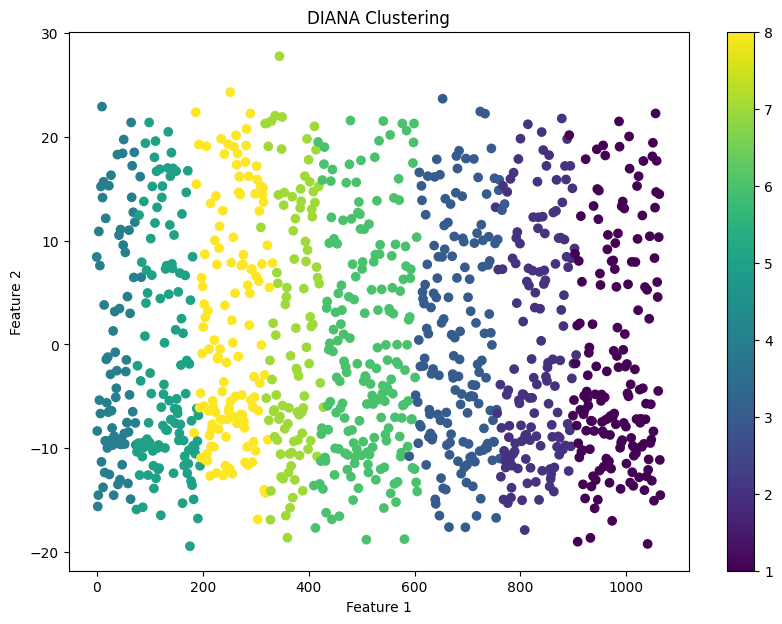

In [134]:
y_diana400 = diana_plot(df_train400, max_clusters=8)

In [135]:
diana_silh400, diana_dbi400, diana_chs400 = clusterization_scores(df_train400, y_diana400)

Silhouette Score: 0.24805294468186775
Davies-Bouldin Index: 1.1887824208581679
Calinski-Harabasz Index: 2350.99001419538


#### features_reduced_598

Teraz zajmiemy się danymi z 598 kolumnami.

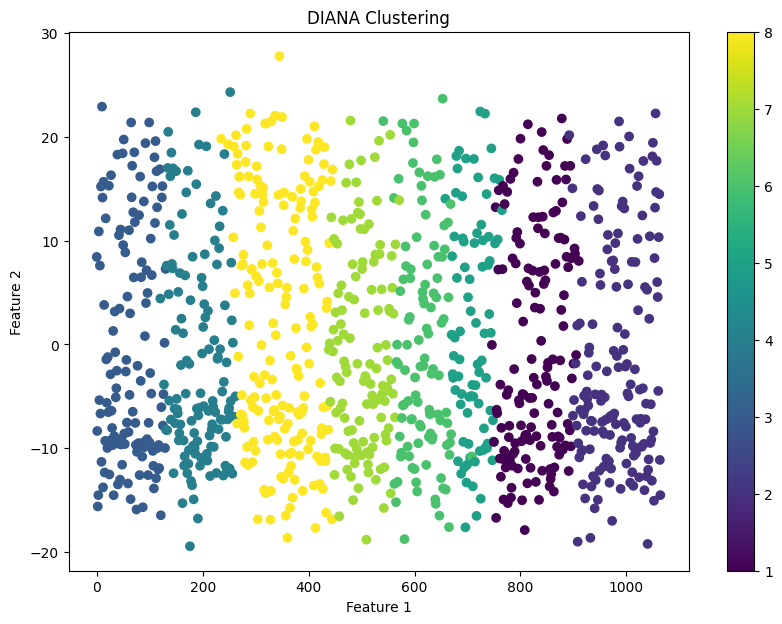

In [136]:
y_diana598 = diana_plot(df_train598, max_clusters=8)

In [137]:
diana_silh598, diana_dbi598, diana_chs598 = clusterization_scores(df_train598, y_diana598)

Silhouette Score: 0.22595794459836563
Davies-Bouldin Index: 1.325066163491714
Calinski-Harabasz Index: 2017.9696316254574


#### word2vec_features

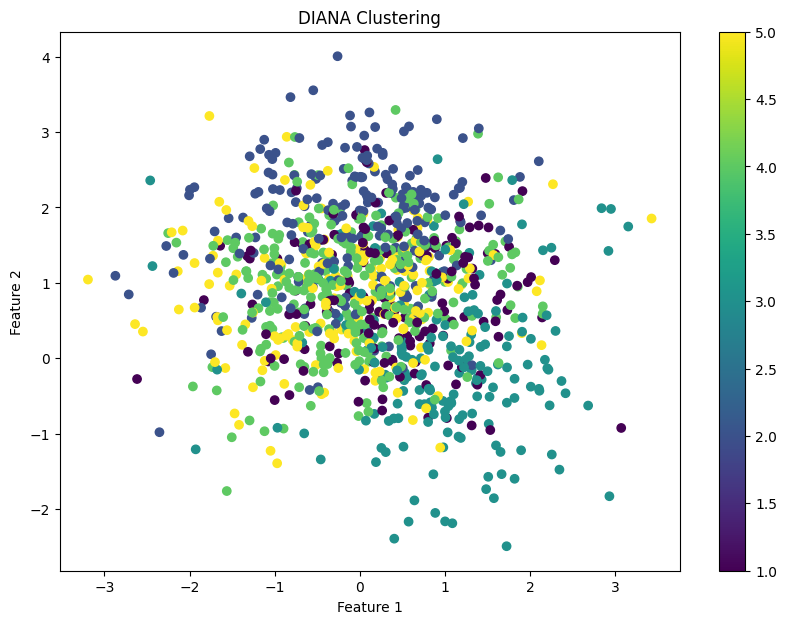

In [138]:
y_diana_w2v = diana_plot(df_word2vec, max_clusters=5)

In [139]:
diana_silh_w2v, diana_dbi_w2v, diana_chs_w2v = clusterization_scores(df_word2vec, y_diana_w2v)

Silhouette Score: 0.1149859976512412
Davies-Bouldin Index: 2.4075666598687597
Calinski-Harabasz Index: 93.51208823626958


#### tfidf_features

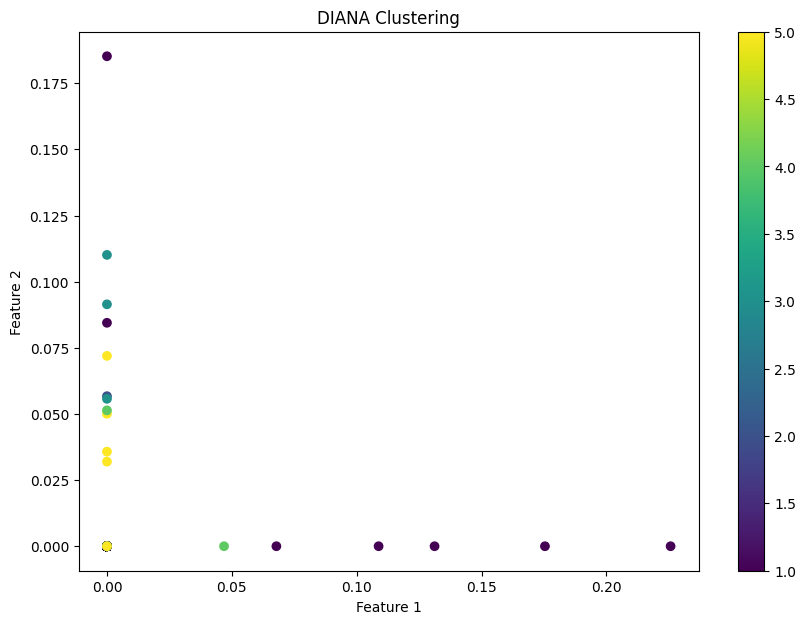

In [140]:
y_diana_tfidf = diana_plot(df_tfidf, max_clusters=5)

In [141]:
diana_silh_tfidf, diana_dbi_tfidf, diana_chs_tfidf = clusterization_scores(df_tfidf, y_diana_tfidf)

Silhouette Score: 0.010281670425500732
Davies-Bouldin Index: 7.014631968799419
Calinski-Harabasz Index: 9.646194371714289


#### ngram_features

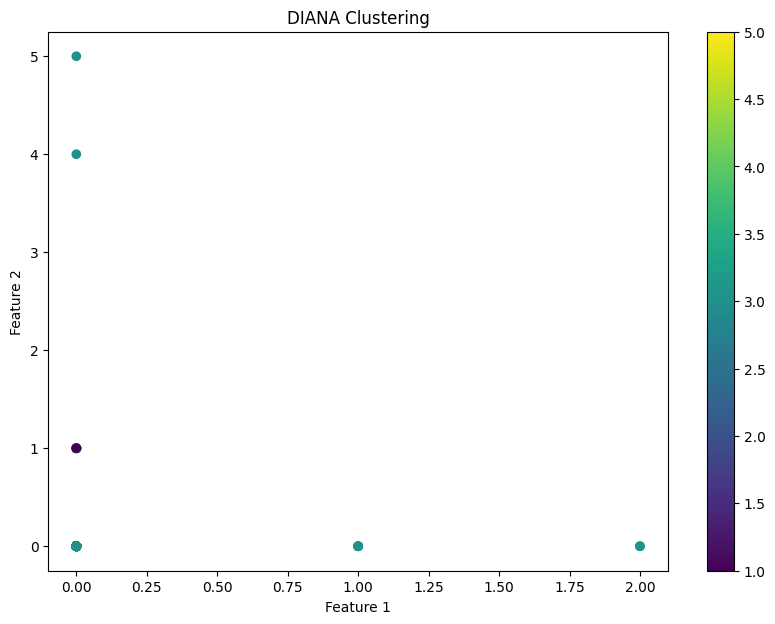

In [142]:
y_diana_ngram = diana_plot(df_ngram, max_clusters=5)

In [143]:
diana_silh_ngram, diana_dbi_ngram, diana_chs_ngram = clusterization_scores(df_ngram, y_diana_ngram)

Silhouette Score: 0.31398738770631596
Davies-Bouldin Index: 2.3810099017826354
Calinski-Harabasz Index: 21.53390358380327


#### glove_features

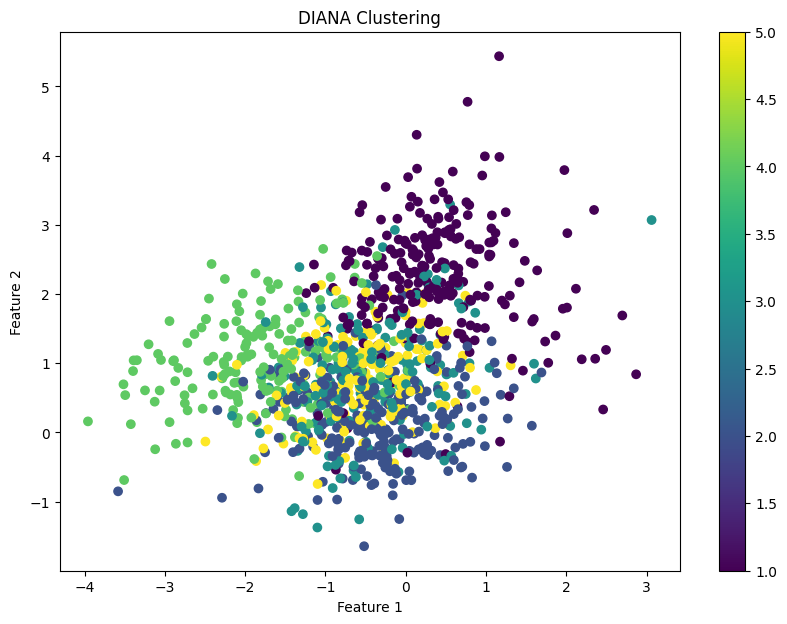

In [144]:
y_diana_glove = diana_plot(df_glove, max_clusters=5)

In [145]:
diana_silh_glove, diana_dbi_glove, diana_chs_glove = clusterization_scores(df_glove, y_diana_glove)

Silhouette Score: 0.11794511299686695
Davies-Bouldin Index: 2.3005907865565374
Calinski-Harabasz Index: 97.53380112482981


##### Podsumowanie

In [146]:
diana_scores = {
    'Data': ['features_reduced_400', 'features_reduced_598', 'word2vec_features', 'tfidf_features', 'ngram_features', 'glove_features'],
    'Silhouette Score': [diana_silh400, diana_silh598, diana_silh_w2v, diana_silh_tfidf, diana_silh_ngram, diana_silh_glove],
    'Davies-Bouldin Score': [diana_dbi400, diana_dbi598, diana_dbi_w2v, diana_dbi_tfidf, diana_dbi_ngram, diana_dbi_glove],
    'Calinski-Harabasz Score': [diana_chs400, diana_chs598, diana_chs_w2v, diana_chs_tfidf, diana_chs_ngram, diana_chs_glove]
    }

diana_scores = pd.DataFrame(diana_scores)
print(diana_scores)

                   Data  Silhouette Score  Davies-Bouldin Score  \
0  features_reduced_400          0.248053              1.188782   
1  features_reduced_598          0.225958              1.325066   
2     word2vec_features          0.114986              2.407567   
3        tfidf_features          0.010282              7.014632   
4        ngram_features          0.313987              2.381010   
5        glove_features          0.117945              2.300591   

   Calinski-Harabasz Score  
0              2350.990014  
1              2017.969632  
2                93.512088  
3                 9.646194  
4                21.533904  
5                97.533801  


## 4. Wybór i ocena algorytmów

Aby wybrać model, który poradził sobie najlepiej, przeanalizujemy wartości trzech wskaźników, które wyliczaliśmy na bieżąco:
- Silhouette Score (im wyższa wartość, tym lepsza klasteryzacja)
- Davies-Bouldin Score (im niższa wartość, tym lepsza klasteryzacja)
- Calinski-Harabasz Score (im wyższa wartość, tym lepsza klasteryzacja)

### Silhouette Score

In [147]:
silhouette = {
    'Algorithm': ['KMeans', 'HAC Single Linkage', 'HAC Complete Linkage', 'HAC Average Linkage', 'HAC Centroid Linkage', 'HAC Wards Linkage', 'DIANA'],
    'features_reduced_400': [kmeans_silh400, sl_silh400, cl_silh400, al_silh400, ctrl_silh400, wl_silh400, diana_silh400],
    'features_reduced_598': [kmeans_silh598, sl_silh598, cl_silh598, al_silh598, ctrl_silh598, wl_silh598, diana_silh598],
    'word2vec_features': [kmeans_silh_w2v, sl_silh_w2v, cl_silh_w2v, al_silh_w2v, ctrl_silh_w2v, wl_silh_w2v, diana_silh_w2v],
    'tfidf_features': [kmeans_silh_tfidf, sl_silh_tfidf, cl_silh_tfidf, al_silh_tfidf, ctrl_silh_tfidf, wl_silh_tfidf, diana_silh_tfidf],
    'ngram_features': [kmeans_silh_ngram, sl_silh_ngram, cl_silh_ngram, al_silh_ngram, ctrl_silh_ngram, wl_silh_ngram, diana_silh_ngram],
    'glove_features': [kmeans_silh_glove, sl_silh_glove, cl_silh_glove, al_silh_glove, ctrl_silh_glove, wl_silh_glove, diana_silh_glove]
    }

silhouette = pd.DataFrame(silhouette)
print(silhouette)

              Algorithm  features_reduced_400  features_reduced_598  \
0                KMeans              0.379527              0.355912   
1    HAC Single Linkage             -0.200654             -0.202670   
2  HAC Complete Linkage              0.368128              0.344784   
3   HAC Average Linkage              0.352609              0.312213   
4  HAC Centroid Linkage              0.350696              0.334652   
5     HAC Wards Linkage              0.356741              0.343767   
6                 DIANA              0.248053              0.225958   

   word2vec_features  tfidf_features  ngram_features  glove_features  
0           0.124780        0.020638        0.594166        0.130579  
1           0.156224        0.005466        0.606327        0.366782  
2           0.102221        0.052961        0.572442        0.234540  
3           0.235252        0.010802        0.626356        0.327626  
4           0.261657        0.012843        0.635639        0.362951  
5    

In [148]:
davies_bouldin_score = {
    'Algorithm': ['KMeans', 'HAC Single Linkage', 'HAC Complete Linkage', 'HAC Average Linkage', 'HAC Centroid Linkage', 'HAC Wards Linkage', 'DIANA'],
    'features_reduced_400': [kmeans_dbi400, sl_dbi400, cl_dbi400, al_dbi400, ctrl_dbi400, wl_dbi400, diana_dbi400],
    'features_reduced_598': [kmeans_dbi598, sl_dbi598, cl_dbi598, al_dbi598, ctrl_dbi598, wl_dbi598, diana_dbi598],
    'word2vec_features': [kmeans_dbi_w2v, sl_dbi_w2v, cl_dbi_w2v, al_dbi_w2v, ctrl_dbi_w2v, wl_dbi_w2v, diana_dbi_w2v],
    'tfidf_features': [kmeans_dbi_tfidf, sl_dbi_tfidf, cl_dbi_tfidf, al_dbi_tfidf, ctrl_dbi_tfidf, wl_dbi_tfidf, diana_dbi_tfidf],
    'ngram_features': [kmeans_dbi_ngram, sl_dbi_ngram, cl_dbi_ngram, al_dbi_ngram, ctrl_dbi_ngram, wl_dbi_ngram, diana_dbi_ngram],
    'glove_features': [kmeans_dbi_glove, sl_dbi_glove, cl_dbi_glove, al_dbi_glove, ctrl_dbi_glove, wl_dbi_glove, diana_dbi_glove]
    }

davies_bouldin_score = pd.DataFrame(davies_bouldin_score)
print(davies_bouldin_score)

              Algorithm  features_reduced_400  features_reduced_598  \
0                KMeans              0.812160              0.869804   
1    HAC Single Linkage              2.164111              2.174128   
2  HAC Complete Linkage              0.875062              0.889184   
3   HAC Average Linkage              0.866240              0.857496   
4  HAC Centroid Linkage              0.850893              0.907771   
5     HAC Wards Linkage              0.809601              0.943075   
6                 DIANA              1.188782              1.325066   

   word2vec_features  tfidf_features  ngram_features  glove_features  
0           2.328722        5.373094        0.288293        2.288855  
1           0.740267        0.982213        0.273085        0.497036  
2           2.365219        0.368426        0.523732        1.978565  
3           0.640054        3.821372        0.263131        1.127817  
4           0.601887        0.974169        0.255640        0.496773  
5    

In [149]:
calinski_harabasz_score = {
    'Algorithm': ['KMeans', 'HAC Single Linkage', 'HAC Complete Linkage', 'HAC Average Linkage', 'HAC Centroid Linkage', 'HAC Wards Linkage', 'DIANA'],
    'features_reduced_400': [kmeans_chs400, sl_chs400, cl_chs400, al_chs400, ctrl_chs400, wl_chs400, diana_chs400],
    'features_reduced_598': [kmeans_chs598, sl_chs598, cl_chs598, al_chs598, ctrl_chs598, wl_chs598, diana_chs598],
    'word2vec_features': [kmeans_chs_w2v, sl_chs_w2v, cl_chs_w2v, al_chs_w2v, ctrl_chs_w2v, wl_chs_w2v, diana_chs_w2v],
    'tfidf_features': [kmeans_chs_tfidf, sl_chs_tfidf, cl_chs_tfidf, al_chs_tfidf, ctrl_chs_tfidf, wl_chs_tfidf, diana_chs_tfidf],
    'ngram_features': [kmeans_chs_ngram, sl_chs_ngram, cl_chs_ngram, al_chs_ngram, ctrl_chs_ngram, wl_chs_ngram, diana_chs_ngram],
    'glove_features': [kmeans_chs_glove, sl_chs_glove, cl_chs_glove, al_chs_glove, ctrl_chs_glove, wl_chs_glove, diana_chs_glove]
    }

calinski_harabasz_score = pd.DataFrame(calinski_harabasz_score)
print(calinski_harabasz_score)

              Algorithm  features_reduced_400  features_reduced_598  \
0                KMeans           3020.862185           2673.185093   
1    HAC Single Linkage              0.168211              0.168164   
2  HAC Complete Linkage           2716.080319           2585.291610   
3   HAC Average Linkage           2653.824875           2301.509877   
4  HAC Centroid Linkage           2729.998665           2544.133567   
5     HAC Wards Linkage           2784.045186           2385.901333   
6                 DIANA           2350.990014           2017.969632   

   word2vec_features  tfidf_features  ngram_features  glove_features  
0          99.467361        5.832340        9.205511       91.182583  
1           1.769649        1.035021       10.536698        3.881300  
2         112.019393        5.366185       11.913515       24.844636  
3           2.367545        1.221202       11.062535        7.784958  
4           2.677604        1.051645       11.724677        3.885345  
5    

Przejdziemy teraz do wyboru finalnego zbioru danych, na którym będziemy pracować, oraz zwycięskiego algorytmu. Po analizie wyników zrezygnowałyśmy z ramek danych features_reduced_400 i features_reduced_598 - z uwagi na za dużą ilość danych. Postanowiłyśmy też mimo dobrych wyników odrzucić zbiór ngram, jako że otrzymywane klastry nie były podobnych rozmiarów - jeden duży i kilka mniejszych, zawierających pojedyncze obserwacje. Z pozostałych zbiorów najlepsze wyniki otrzymywał ten otrzymany metodą glove. To na nim będziemy dalej pracować.

In [150]:
df = df_glove

In [151]:
glove = {
    'Algorithm': ['KMeans', 'HAC Single Linkage', 'HAC Complete Linkage', 'HAC Average Linkage', 'HAC Centroid Linkage', 'HAC Wards Linkage', 'DIANA'],
    'Silhouette score': [kmeans_silh_glove, sl_silh_glove, cl_silh_glove, al_silh_glove, ctrl_silh_glove, wl_silh_glove, diana_silh_glove],
    'Davies-Bouldin score': [kmeans_dbi_glove, sl_dbi_glove, cl_dbi_glove, al_dbi_glove, ctrl_dbi_glove, wl_dbi_glove, diana_dbi_glove],
    'Calinski-Harabasz score': [kmeans_chs_glove, sl_chs_glove, cl_chs_glove, al_chs_glove, ctrl_chs_glove, wl_chs_glove, diana_chs_glove]
}

glove = pd.DataFrame(glove)
print(glove)

              Algorithm  Silhouette score  Davies-Bouldin score  \
0                KMeans          0.130579              2.288855   
1    HAC Single Linkage          0.366782              0.497036   
2  HAC Complete Linkage          0.234540              1.978565   
3   HAC Average Linkage          0.327626              1.127817   
4  HAC Centroid Linkage          0.362951              0.496773   
5     HAC Wards Linkage          0.127944              2.192827   
6                 DIANA          0.117945              2.300591   

   Calinski-Harabasz score  
0                91.182583  
1                 3.881300  
2                24.844636  
3                 7.784958  
4                 3.885345  
5                80.410369  
6                97.533801  


Najlepsze wyniki (a przy tym klastry podobnych rozmiarów) uzyskane zostały w większości przypadków algorytmem HAC Ward's Linkage. To na nim oprzemy nasz model.

In [152]:
glove = {
    'Algorithm': ['HAC Ward Linkage'],
    'Silhouette score': [wl_silh_glove],
    'Davies-Bouldin score': [wl_dbi_glove],
    'Calinski-Harabasz score': [wl_chs_glove]
}

glove = pd.DataFrame(glove)
print(glove)

          Algorithm  Silhouette score  Davies-Bouldin score  \
0  HAC Ward Linkage          0.127944              2.192827   

   Calinski-Harabasz score  
0                80.410369  


Sprawdźmy, jak model radzi sobie dla danych testowych:

In [153]:
df_glove_test = pd.read_csv('data\\glove_test.csv')

In [154]:
df_glove_test = df_glove_test.values

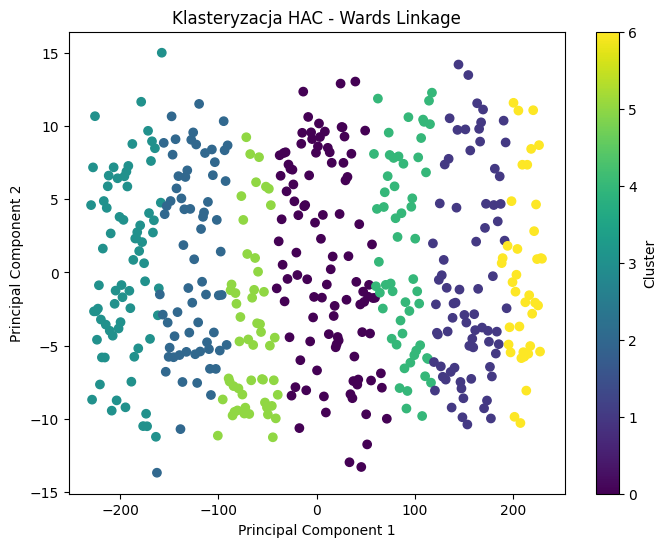

In [155]:
y_wl_glove_test = ward_linkage_plot(df_glove_test, n_clusters=7)

In [158]:
wl_silh_glove_test = silhouette_score(df_glove_test, y_wl_glove_test)
print(f'Silhouette Score: {wl_silh_glove_test}')

Silhouette Score: 0.3486262024735655


Widzimy, że silhouette jest wyższy dla danych treningowych niż dla walidacyjnych.

## 5. Optymalizacja modelu

Jak widać, wyniki nie są najlepsze. Przy testowaniu algorytmów wcześniej sprawdzałyśmy różne wartości parametrów i zatrzymywałyśmy się na jednej z nich, ale nie dokumentowałyśmy tych prób z uwagi na i tak już dość rozbudowany kod. Poniżej spróbujemy jednak dostosować działanie modelu.
Przypomnijmy funkcję z algorytmem single linkage:

In [ ]:
def ward_linkage_plot(X, n_clusters=None, distance_threshold=None, linkage_method='ward'):
    """
    Przeprowadza hierarchiczną klasteryzację aglomeracyjną i rysuje dendrogram.
    
    :param X: przekształcone i zwektoryzowane dane tekstowe (np. TF-IDF lub embeddings)
    :param n_clusters: liczba klastrów (opcjonalnie, jeśli chcemy określić liczbę klastrów)
    :param distance_threshold: próg odległości dla tworzenia klastrów (jeśli nie podano n_clusters)
    :param linkage_method: metoda łączenia klastrów ('ward', 'single', 'complete', 'average')
    """
    # Przeprowadzenie hierarchicznej klasteryzacji aglomeracyjnej
    hac = AgglomerativeClustering(n_clusters=n_clusters, 
                                  distance_threshold=distance_threshold, 
                                  metric='euclidean', 
                                  linkage=linkage_method)
    hac.fit(X)
    
    labels = hac.labels_

    
    # Redukcja wymiarowości danych do dwóch wymiarów za pomocą PCA dla wizualizacji
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)
    
    # Rysowanie klastrów
    plt.figure(figsize=(8, 6))
    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=hac.labels_, cmap='viridis')
    plt.title('Klasteryzacja HAC - Wards Linkage')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.colorbar(label='Cluster')
    plt.show()

    return labels


Dobierzemy optymalną liczbę klastrów przy użyciu metryk silhouette i elbow:

In [ ]:
def optimal_number_of_clusters(df, max_k):
    iters = range(2, max_k + 1)
    sse = []
    silhouette_scores = []
    
    for k in iters:
        model = AgglomerativeClustering(n_clusters=k, linkage='ward')
        model.fit(df)
        
        # Calculate the sum of squared distances (SSE)
        labels = model.labels_
        cluster_centers = np.array([df[labels == i].mean(axis=0) for i in range(k)])
        distances = np.min(cdist(df, cluster_centers, 'euclidean'), axis=1)
        sse.append(np.sum(distances ** 2))
        
        # Calculate the silhouette score
        score = silhouette_score(df, labels)
        silhouette_scores.append(score)

    # Plotting the results
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    
    ax1.plot(iters, sse, marker='o')
    ax1.set_xlabel('Number of Clusters')
    ax1.set_xticks(iters)
    ax1.set_xticklabels(iters)
    ax1.set_ylabel('SSE')
    ax1.set_title('Elbow Method')
    
    ax2.plot(iters, silhouette_scores, marker='o')
    ax2.set_xlabel('Number of Clusters')
    ax2.set_xticks(iters)
    ax2.set_xticklabels(iters)
    ax2.set_ylabel('Silhouette Score')
    ax2.set_title('Silhouette Score')
    
    plt.show()


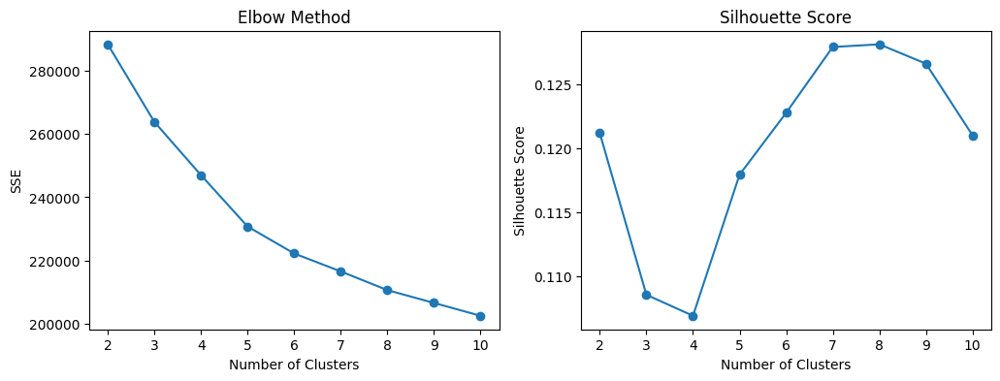

In [ ]:
warnings.filterwarnings('ignore')
optimal_number_of_clusters(df, 10)

Z metody łokcia otrzymujemy liczbę 6-7 klastrów, natomiast z silhouette - 7 lub 8 klastrów. Zobaczmy, jak dla tych wartości przebiega klasteryzacja:

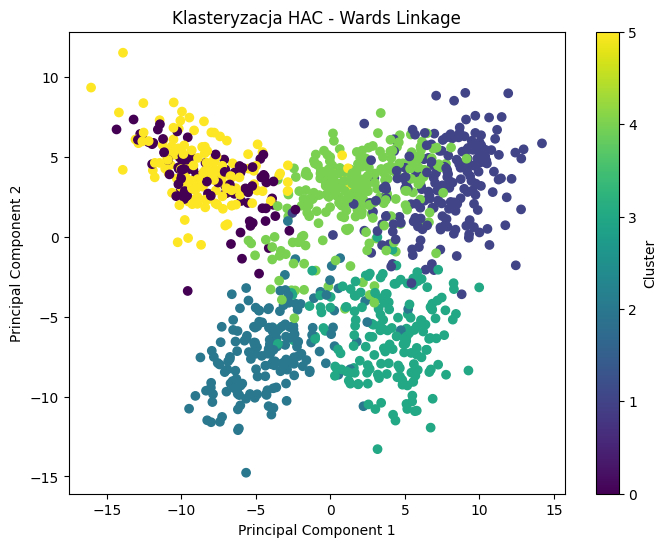

In [ ]:
labels6 = ward_linkage_plot(df, 6)

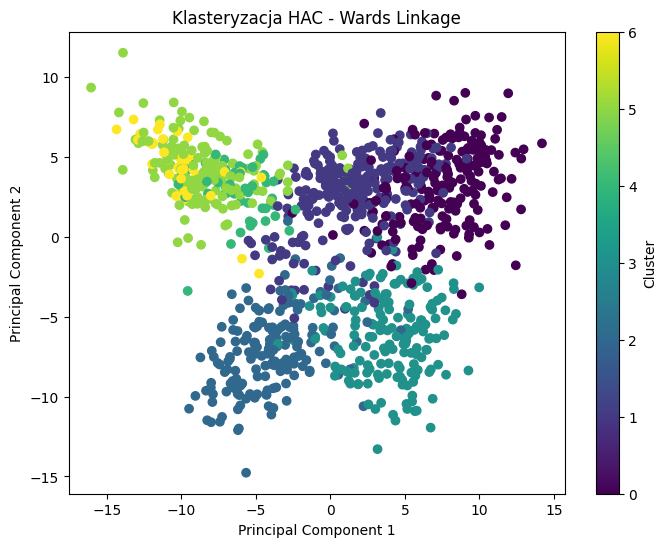

In [ ]:
labels7 = ward_linkage_plot(df, 7)

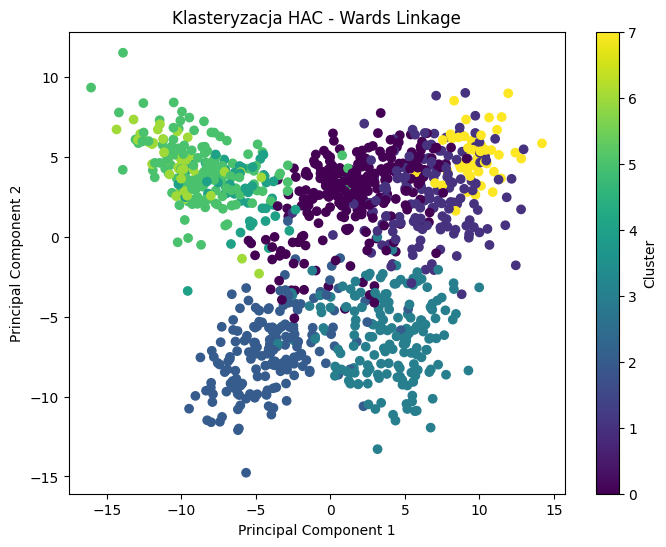

In [ ]:
labels8 = ward_linkage_plot(df, 8)

Zatrzymamy się na 6 klastrach, gdyż przy wartościach 7 i 8 dodatkowo powstające klastry nie są wyraźnie oddzielone, zwiększenie ich liczby wydaje się więc niepotrzebne.

## 6. Analiza biznesowa i wnioski

Przeprowadzimy teraz analizę otrzymanych wyników i spróbujemy je zinterpretować:

In [ ]:
# Tworzymy model klastrowania z 7 klastrami
model = AgglomerativeClustering(n_clusters=7, linkage='ward')
df = pd.DataFrame(df)
model.fit(pd.DataFrame(df).values)

# Przypisujemy etykiety klastrów do danych
df['cluster'] = model.labels_

Powróćmy teraz do danych tekstowych, tak aby zobaczyć, jak poszczególne fragmenty zostały pogrupowane. Jako że operacje na danych miały wpływ na kolumny, a nie na wiersze, wszystkie indeksy zostały zachowane. Możemy z nich skorzystać:

In [ ]:
examples = []
for i in range(7):
    indices = df[df['cluster'] == i].index
    index = indices[0]
    examples.append(index)

print(examples)


[1, 0, 6, 5, 8, 4, 92]


Zobaczmy teksty (zapisaliśmy przetworzone w wyniku pierwszego etapu teksty do pliku i z nich korzystamy):

In [ ]:
df_prepared = pd.read_csv('data\\df_prepared.csv')

In [ ]:
df_prepared['cluster'] = model.labels_

In [ ]:
for i in range(7):
    texts = []
    print('Label:', i)
    texts.append(df_prepared.iloc[examples[i], 1])
    print(texts)

Label: 0
["Ailing EuroDisney vows turnaround\n \n EuroDisney, the European home of Mickey Mouse and friends, has said it will sell 253m euros (Â£175m; $328m) of new shares as it looks to avoid insolvency.\n \n The sale is the last part of a plan to restructure 2.4bn euros-worth of debts. Despite struggling since it was opened in 1992, EuroDisney has recently made progress in turning its business around and ticket sales have picked up. However, analysts still question whether it attracts enough visitors to stay open, even with the restructuring.\n \n EuroDisney remains Europe's largest single tourist attraction, attracting some 12.4 million visitors annually. A new attraction - Walt Disney Studios - has recently opened its site near Paris. The company's currently traded stock tumbled in Paris on the latest news, shedding 15% to 22 euro cents. EuroDisney will sell the new shares priced at 9 euros cents each. The US Disney Corporation and Saudi Arabian prince Al-Walid bin Talal, the firm'

In [ ]:
df_prepared.head()

,Unnamed: 0,Text,Label,Cleaned_text,Lemmatized_text,Text_with_removed_words,cluster
0,0,Double eviction from Big Brother\n \n Model Ca...,3,double eviction big brother model caprice holb...,double eviction big brother model caprice holb...,double eviction big brother model caprice holb...,1
1,1,Ailing EuroDisney vows turnaround\n \n EuroDis...,4,ailing eurodisney vows turnaround eurodisney e...,ail eurodisney vow turnaround eurodisney europ...,ailing eurodisney vows turnaround eurodisney e...,0
2,2,Japanese growth grinds to a halt\n \n Growth i...,4,japanese growth grinds halt growth japan evapo...,japanese growth grind halt growth japan evapor...,japanese growth grinds halt growth japan evapo...,0
3,3,Small firms 'hit by rising costs'\n \n Rising ...,4,small firms rising rising fuel materials costs...,small firm rise rise fuel material cost hit co...,small firms rising rising fuel materials costs...,0
4,4,Mexicans tracking unhappy Juninho\n \n Mexican...,1,mexicans tracking unhappy juninho mexican outf...,mexican track unhappy juninho mexican outfit r...,mexicans tracking unhappy juninho mexican outf...,5


Stwórzmy jeszcze wykresy wordcloud dla tekstów z poszczególnych kategorii, wykorzystując funkcję z pierwszego etapu budowy:

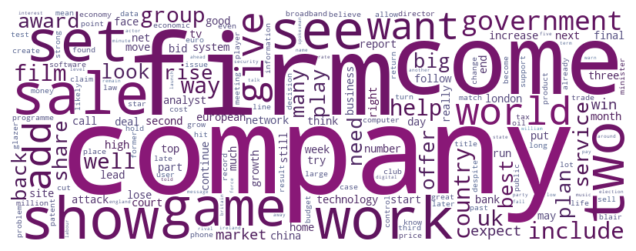

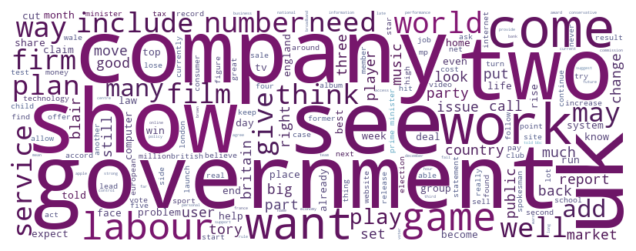

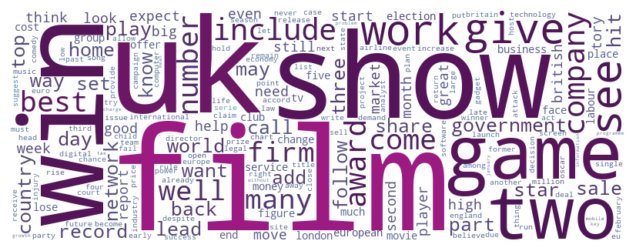

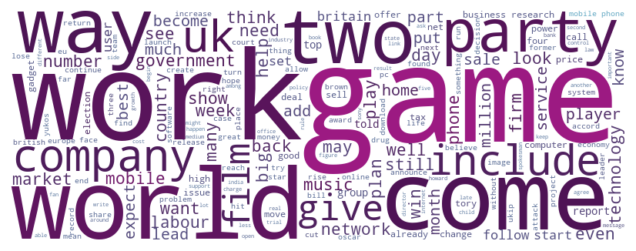

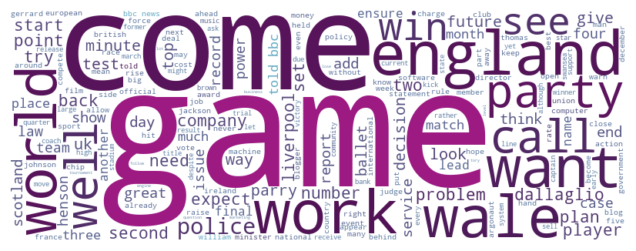

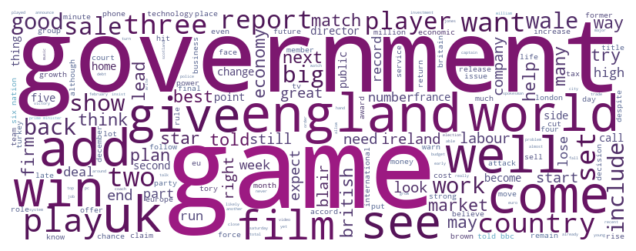

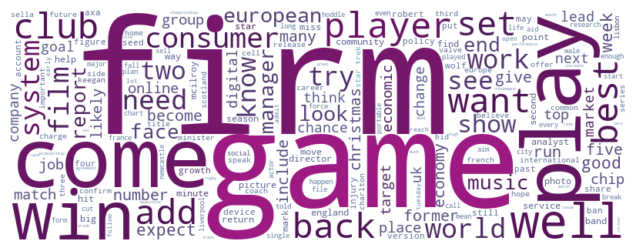

In [ ]:
colors = ["#62a8c3", "#4d1354", "#9c1a82"]
cmap = mcolors.LinearSegmentedColormap.from_list("custom_cmap", colors, N=256)

def color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    max_frequency = max(word_freq.values())
    min_frequency = min(word_freq.values())
    normalized_freq = (word_freq[word] - min_frequency) / (max_frequency - min_frequency)
    return mcolors.rgb2hex(cmap(normalized_freq))

def remove_words(text, words):
    for word in words:
        pattern = r'\b' + re.escape(word) + r'\b'
        text = re.sub(pattern, '', text, flags=re.IGNORECASE)
        text = re.sub(r'\s+', ' ', text).strip()
    return text

stopwords_set = set(stopwords.words('english'))
stopwords_to_add = ['say', 'mr', 'would', 'also', 'u', 'could', 'one', 'new', 'year', 'people', 'us', 'first', 'last', 'time', 'make', 'go', 'take', 'use']
stopwords_set.update(stopwords_to_add)

for i in range(7):
    all_text = ' '.join(df_prepared.loc[df_prepared['cluster'] == i, 'Lemmatized_text'])
    all_text = remove_words(all_text, stopwords_set)
    word_freq = Counter(re.findall(r'\b\w+\b', all_text.lower()))



    wordcloud = WordCloud(width=800, height=300, background_color='white', color_func=color_func).generate(all_text)
    plt.figure(figsize=(8, 3))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()


In [ ]:
def clean_text(text):
    stopwords_set = set(stopwords.words('english'))
    stopwords_to_add = ['say', 'mr', 'would', 'also', 'u', 'could', 'one', 'new', 'year', 'people', 'us', 'first', 'last', 'time', 'make', 'go', 'take', 'use']
    stopwords_set.update(stopwords_to_add)
    tokens = word_tokenize(text.lower())
    words = [word for word in tokens if word.isalpha() and word not in stopwords_set]
    return words

('get', 'company', 'world', 'come', 'sale', 'firm', 'two', 'show', 'game', 'give', 'set', 'government', 'work', 'see', 'add', 'best', 'want', 'include', 'country', 'film', 'group', 'help', 'way', 'rise', 'bbc', 'service', 'right', 'well', 'uk', 'award', 'share', 'back', 'month', 'second', 'high', 'next', 'market', 'offer', 'court', 'look', 'many', 'big', 'told', 'tv', 'plan', 'three', 'play', 'minister', 'need', 'expect')


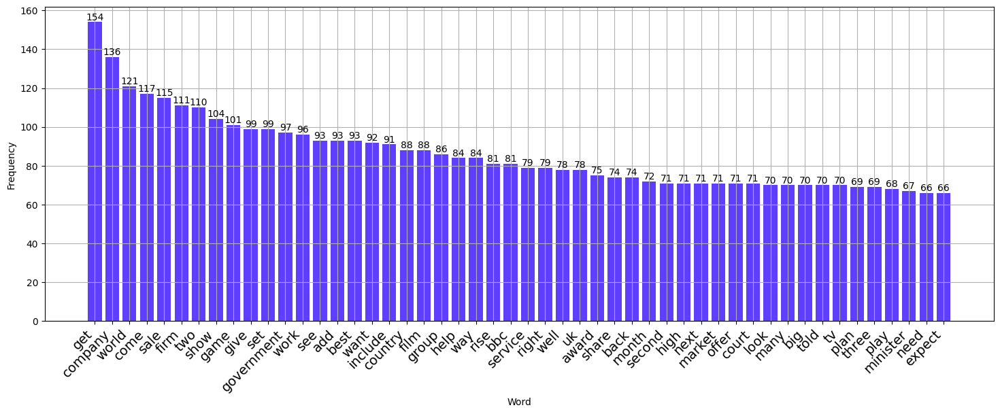

('get', 'world', 'show', 'labour', 'two', 'game', 'company', 'government', 'see', 'uk', 'work', 'come', 'want', 'number', 'party', 'minister', 'month', 'service', 'plan', 'told', 'way', 'like', 'play', 'need', 'music', 'include', 'well', 'home', 'think', 'film', 'firm', 'blair', 'tax', 'market', 'election', 'three', 'player', 'give', 'may', 'many', 'public', 'tory', 'add', 'report', 'next', 'country', 'best', 'good', 'phone', 'big')


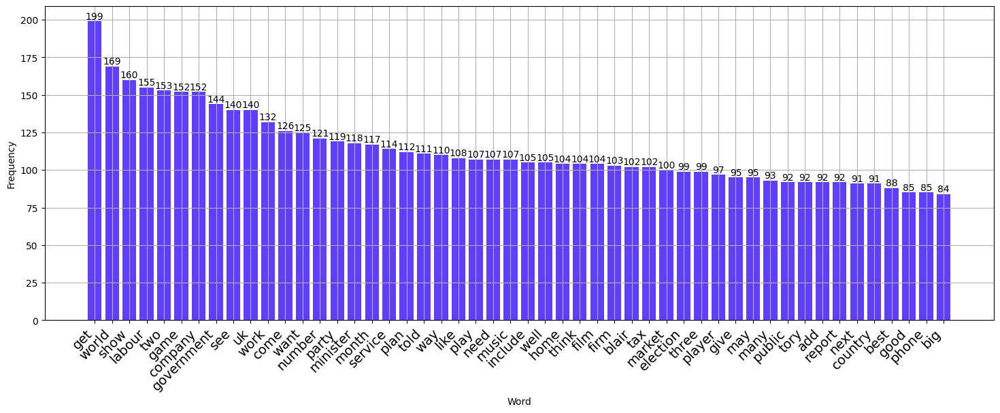

('film', 'get', 'uk', 'best', 'game', 'show', 'win', 'work', 'two', 'give', 'see', 'award', 'company', 'include', 'come', 'firm', 'number', 'well', 'world', 'star', 'play', 'many', 'back', 'government', 'sale', 'day', 'three', 'add', 'want', 'lead', 'market', 'way', 'hit', 'part', 'election', 'top', 'record', 'country', 'week', 'share', 'look', 'home', 'like', 'may', 'bbc', 'big', 'next', 'follow', 'month', 'network')


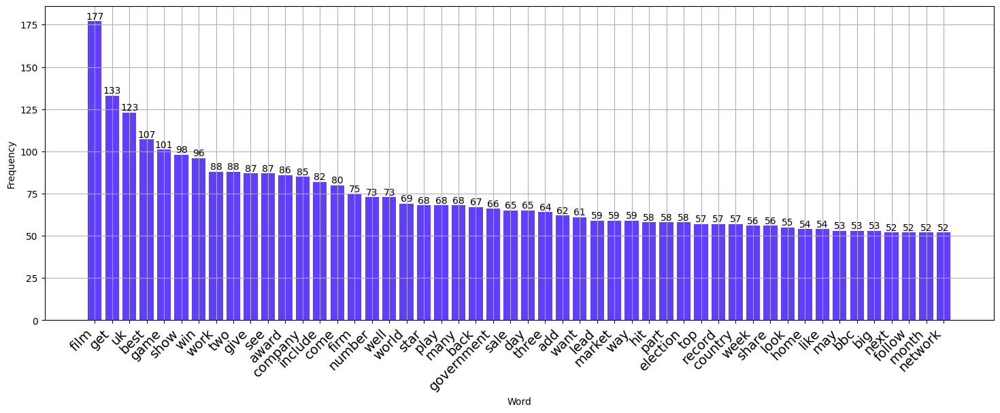

('game', 'get', 'mobile', 'phone', 'world', 'work', 'music', 'party', 'come', 'uk', 'way', 'two', 'government', 'company', 'firm', 'show', 'include', 'give', 'film', 'play', 'home', 'told', 'number', 'well', 'week', 'back', 'like', 'look', 'want', 'see', 'player', 'market', 'election', 'many', 'country', 'think', 'service', 'technology', 'million', 'need', 'network', 'month', 'win', 'plan', 'still', 'day', 'may', 'help', 'big', 'labour')


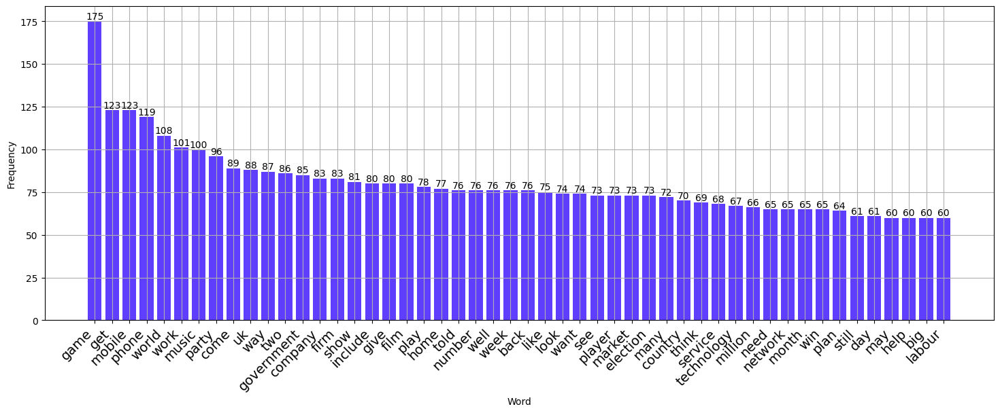

('game', 'get', 'party', 'world', 'come', 'england', 'work', 'told', 'wale', 'want', 'problem', 'call', 'well', 'win', 'see', 'police', 'dallaglio', 'two', 'like', 'plan', 'second', 'test', 'back', 'player', 'point', 'try', 'set', 'company', 'look', 'start', 'williams', 'day', 'expect', 'number', 'need', 'liverpool', 'rate', 'minute', 'news', 'way', 'give', 'top', 'decision', 'future', 'bbc', 'uk', 'minister', 'parry', 'great', 'end')


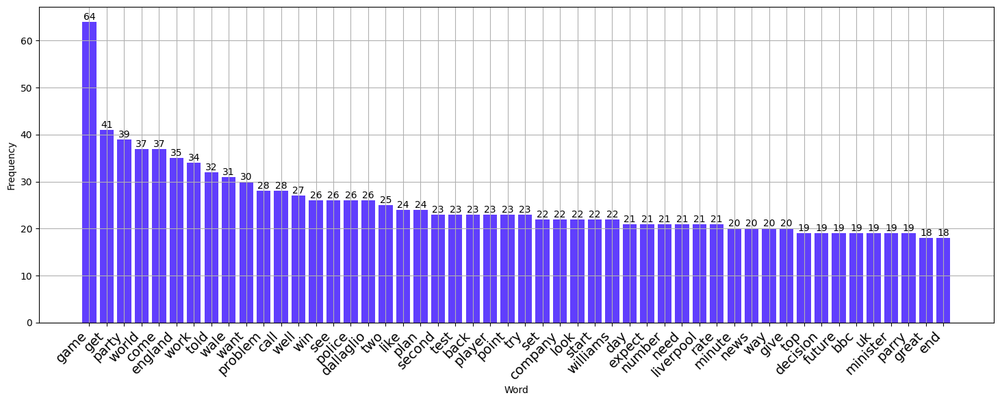

('game', 'get', 'government', 'england', 'world', 'film', 'come', 'win', 'add', 'well', 'told', 'uk', 'give', 'country', 'best', 'three', 'two', 'see', 'set', 'play', 'player', 'want', 'next', 'show', 'report', 'big', 'sale', 'work', 'right', 'match', 'star', 'blair', 'back', 'good', 'home', 'month', 'wale', 'look', 'include', 'lead', 'like', 'market', 'nation', 'plan', 'way', 'ireland', 'firm', 'help', 'week', 'think')


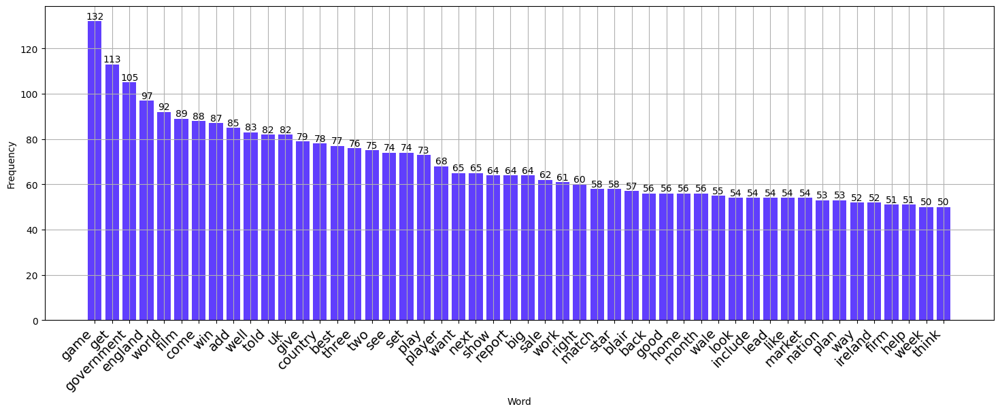

('game', 'get', 'firm', 'come', 'player', 'play', 'system', 'win', 'well', 'club', 'best', 'want', 'back', 'add', 'set', 'music', 'consumer', 'star', 'report', 'market', 'film', 'economic', 'world', 'need', 'like', 'work', 'try', 'target', 'two', 'know', 'see', 'growth', 'show', 'european', 'manager', 'look', 'lisbon', 'face', 'digital', 'end', 'expect', 'good', 'minute', 'week', 'number', 'former', 'many', 'five', 'run', 'include')


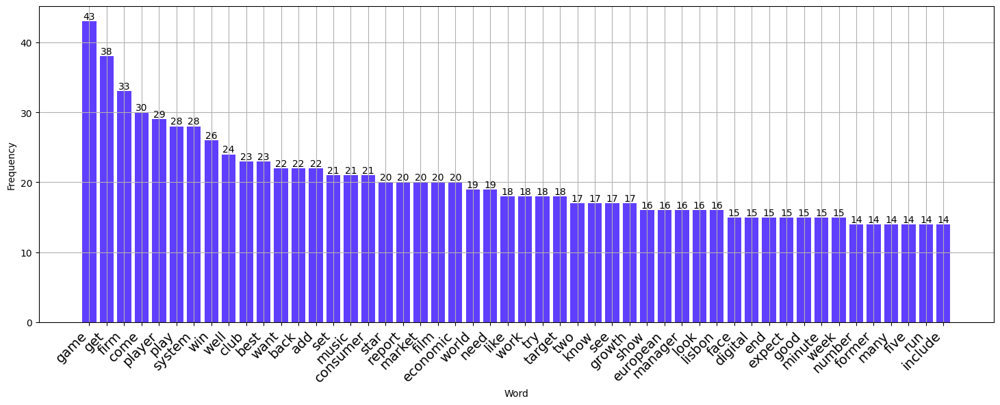

In [ ]:
for i in range(7):
    temp = df_prepared.loc[df_prepared['cluster'] == i]
    words = temp['Lemmatized_text'].apply(clean_text).sum()
    word_counts = Counter(words)
    most_common_words = word_counts.most_common(50)
    words, counts = zip(*most_common_words)
    print(words)
    plt.figure(figsize=(18, 6))
    plt.bar(words, counts, color='#603efd')
    plt.xlabel('Word')
    plt.ylabel('Frequency')
    plt.xticks(rotation=45, fontsize=14, ha='right')

    for j in range(len(counts)):
        plt.text(j, counts[j], str(counts[j]), ha='center', va='bottom', fontsize=10)
    plt.grid(None)
    plt.show()

### Wnioski:

- Wybrany algorytm uzyskał najlepsze wyniki spośród wszystkich testowanych, jednak nie są one wybitnie wysokie.
- Modele językowe są zwykle trenowane na ogromnej liczbie danych - nasze zawierały tylko około 1000 rekordów. To może być przyczyną średniozadowalających wyników naszego projektu.
- Stworzonych zostało 7 klastrów, które da się wyjaśnić - teksty zostały zaklasyfikowane do takich kategorii jak Sports, Business, Film, Politics and Entertainment i inne.